### DOMAIN : Semiconductor manufacturing process
#### CONTEXT :
A complex modern semiconductor manufacturing process is normally under constant surveillance via the monitoring of 
    signals/variables collected from sensors and or process measurement points. However, not all of these signals are
    equally valuable in a specific monitoring system. The measured signals contain a combination of useful information, 
    irrelevant information as well as noise. Engineers typically have a much larger number of signals than are actually
    required. If we consider each type of signal as a feature, then feature selection may be applied to identify the most
    relevant signals. The Process Engineers may then use these signals to determine key factors contributing to yield 
    excursions downstream in the process. This will enable an increase in process throughput, decreased time to learning
    and reduce the per unit production costs. These signals can be used as features to predict the yield type. And by 
    analysing and trying out different combinations of features, essential signals that are impacting the yield type can
    be identified.
#### DATA DESCRIPTION: signal-data.csv
The data consists of 1567 datapoints each with 591 features. 
    The dataset presented in this case represents a selection of such features where each example represents a single
    production entity with associated measured features and the labels represent a simple pass/fail yield for in house
    line testing. Target column “ –1” corresponds to a pass and “1” corresponds to a fail and the data time stamp is for
    that specific test point.
#### PROJECT OBJECTIVE:
We will build a classifier to predict the Pass/Fail yield of a particular process entity and analyse whether all the 
    features are required to build the model or not

In [63]:
# Numerical libraries
import numpy as np   

from sklearn.model_selection import train_test_split

from sklearn.cluster import KMeans

# to handle data in form of rows and columns 
import pandas as pd    

# importing ploting libraries
import matplotlib.pyplot as plt   

#importing seaborn for statistical plots
import seaborn as sns

from sklearn import metrics

import pandas as pd

import warnings
warnings.simplefilter('ignore')

from sklearn.preprocessing import binarize
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import zscore
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score,f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
#from xgboost import XGBClassifier
#from lightgbm import LGBMClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold,cross_val_score,KFold
from imblearn.over_sampling import SMOTE,ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV
from sklearn import metrics

#pd.set_option('max_columns',None)
#pd.set_option('max_rows',50)
#pd.options.display.max_rows = 100
pd.set_option('display.min_rows', 500)
pd.set_option('display.max_rows', 500)

### Q1:  Import and understand the data.
#### Q1A: Import ‘signal-data.csv’ as DataFrame

In [64]:
df = pd.read_csv('signal-data.csv')
df.head()

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


#### Q1B:  Print 5 point summary and share at least 2 observations. 

In [65]:
#df.describe().T
df.describe().T

,count,mean,std,min,25%,50%,75%,max
0,1561.0,3014.452896,73.621787,2743.2400,2966.260000,3011.49000,3056.650000,3356.3500
1,1560.0,2495.850231,80.407705,2158.7500,2452.247500,2499.40500,2538.822500,2846.4400
2,1553.0,2200.547318,29.513152,2060.6600,2181.044400,2201.06670,2218.055500,2315.2667
3,1553.0,1396.376627,441.691640,0.0000,1081.875800,1285.21440,1591.223500,3715.0417
4,1553.0,4.197013,56.355540,0.6815,1.017700,1.31680,1.525700,1114.5366
5,1553.0,100.000000,0.000000,100.0000,100.000000,100.00000,100.000000,100.0000
6,1553.0,101.112908,6.237214,82.1311,97.920000,101.51220,104.586700,129.2522
7,1558.0,0.121822,0.008961,0.0000,0.121100,0.12240,0.123800,0.1286
8,1565.0,1.462862,0.073897,1.1910,1.411200,1.46160,1.516900,1.6564
9,1565.0,-0.000841,0.015116,-0.0534,-0.010800,-0.00130,0.008400,0.0749


- Most of the features data is right skewed.
- Few features have values in negative range upto 0.
- Few features have values spreading through large negative values to large positive values.
- Target variable Pass/Fail have values -1 and +1.
- Some features have standard deviation zero which indicates every value in the feature is same and there is no spread.

###  Data cleansing:
####  Q2A: Write a for loop which will remove all the features with 20%+ Null values and impute rest with mean of the feature.

In [66]:
df.dtypes.value_counts()

float64    590
object       1
int64        1
dtype: int64

In [67]:
df.shape

(1567, 592)

- Signal dataframe containe 1567 rows and 592 columns.

In [68]:
# Calculate the percentage of null values for each feature
null_percentage = df.isnull().mean() * 100
null_percentage

Time          0.000000
0             0.382897
1             0.446713
2             0.893427
3             0.893427
4             0.893427
5             0.893427
6             0.893427
7             0.574346
8             0.127632
9             0.127632
10            0.127632
11            0.127632
12            0.127632
13            0.191449
14            0.191449
15            0.191449
16            0.191449
17            0.191449
18            0.191449
19            0.638162
20            0.000000
21            0.127632
22            0.127632
23            0.127632
24            0.127632
25            0.127632
26            0.127632
27            0.127632
28            0.127632
29            0.127632
30            0.127632
31            0.127632
32            0.063816
33            0.063816
34            0.063816
35            0.063816
36            0.063816
37            0.063816
38            0.063816
39            0.063816
40            1.531589
41            1.531589
42         

In [69]:
# Create a list of features to drop (with 20% or more null values)
features_to_drop = null_percentage[null_percentage >= 20].index.tolist()
features_to_drop

['72',
 '73',
 '85',
 '109',
 '110',
 '111',
 '112',
 '157',
 '158',
 '220',
 '244',
 '245',
 '246',
 '247',
 '292',
 '293',
 '345',
 '346',
 '358',
 '382',
 '383',
 '384',
 '385',
 '492',
 '516',
 '517',
 '518',
 '519',
 '578',
 '579',
 '580',
 '581']

In [70]:
len(features_to_drop)

32

In [71]:
# Remove features with 20% or more null values
df.drop(features_to_drop, axis=1, inplace=True)

In [72]:
# Impute null values in the remaining features with the mean
for col in df.columns:
    if df[col].isnull().any():  # Check if the feature has null values
        mean_value = df[col].mean()
        df[col].fillna(mean_value, inplace=True)

In [73]:
print("DataFrame after removing features with 20%+ null values and imputing the rest with the mean:")
print(df)

DataFrame after removing features with 20%+ null values and imputing the rest with the mean:
                     Time            0            1            2            3  \
0     2008-07-19 11:55:00  3030.930000  2564.000000  2187.733300  1411.126500   
1     2008-07-19 12:32:00  3095.780000  2465.140000  2230.422200  1463.660600   
2     2008-07-19 13:17:00  2932.610000  2559.940000  2186.411100  1698.017200   
3     2008-07-19 14:43:00  2988.720000  2479.900000  2199.033300   909.792600   
4     2008-07-19 15:22:00  3032.240000  2502.870000  2233.366700  1326.520000   
5     2008-07-19 17:53:00  2946.250000  2432.840000  2233.366700  1326.520000   
6     2008-07-19 19:44:00  3030.270000  2430.120000  2230.422200  1463.660600   
7     2008-07-19 19:45:00  3058.880000  2690.150000  2248.900000  1004.469200   
8     2008-07-19 20:24:00  2967.680000  2600.470000  2248.900000  1004.469200   
9     2008-07-19 21:35:00  3016.110000  2428.370000  2248.900000  1004.469200   
10    2008-07-19

In [74]:
df.shape

(1567, 560)

In [75]:
# again, checking if there is any NULL values left.
df.isnull().any().any()

False

- As we can see the shape of signal df reduced to 1567 rows and 560 columns. 32 features were removed which contained 20%+ NULL values and rest have been imputed those features containing null values.

In [76]:
signal_df = df.copy()

In [77]:
signal_df.shape

(1567, 560)

In [78]:
nunique = signal_df.apply(pd.Series.nunique)
nunique

Time         1534
0            1521
1            1505
2             508
3             519
4             504
5               1
6             511
7              90
8            1209
9             569
10            393
11            379
12           1548
13              1
14           1556
15           1562
16           1478
17            282
18           1549
19            362
20            552
21           1296
22           1177
23           1481
24           1495
25            705
26            625
27           1149
28            870
29            189
30            843
31           1276
32            339
33            331
34            330
35            332
36            331
37            326
38            330
39            334
40            292
41            316
42              1
43           1524
44           1377
45           1521
46           1563
47           1342
48           1487
49              1
50           1521
51           1563
52              1
53            154
54        

 #### Q2B: Identify and drop the features which are having same value for all the rows.

In [79]:
# Identify features with the same value for all rows
features_to_drop = [col for col in signal_df.columns if df[col].nunique() == 1]
len(features_to_drop)

116

In [80]:
# Drop features with the same value for all rows
signal_df.drop(features_to_drop, axis=1, inplace=True)

In [81]:
signal_df.shape

(1567, 444)

- As can be seen above, there are about 116 features which has same values across all rows and all of such features are being dropped.

#### Q2C: Drop other features if required using relevant functional knowledge. Clearly justify the same.

In [82]:
# checking how many rows have missing values shows that all rows have atleast one missing value
rows=signal_df.isnull().any(axis = 1).sum()
print( 'All the' ,rows,'rows have atleast one missing value')

All the 0 rows have atleast one missing value


In [83]:
# Drop 'Time' feature which is not needed.
signal_df.drop('Time', axis=1, inplace=True)

In [84]:
signal_df.head()

,0,1,2,3,4,6,7,8,9,10,...,577,582,583,584,585,586,587,588,589,Pass/Fail
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,-0.0034,...,14.9509,0.5005,0.0118,0.0035,2.3630,0.021458,0.016475,0.005283,99.670066,-1
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,...,10.9003,0.5019,0.0223,0.0055,4.4447,0.009600,0.020100,0.006000,208.204500,-1
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.4436,0.0041,0.0013,...,9.2721,0.4958,0.0157,0.0039,3.1745,0.058400,0.048400,0.014800,82.860200,1
3,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.4882,-0.0124,-0.0033,...,8.5831,0.4990,0.0103,0.0025,2.0544,0.020200,0.014900,0.004400,73.843200,-1
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.5031,-0.0031,-0.0072,...,10.9698,0.4800,0.4766,0.1045,99.3032,0.020200,0.014900,0.004400,73.843200,-1


- There are no rows having missing values now.

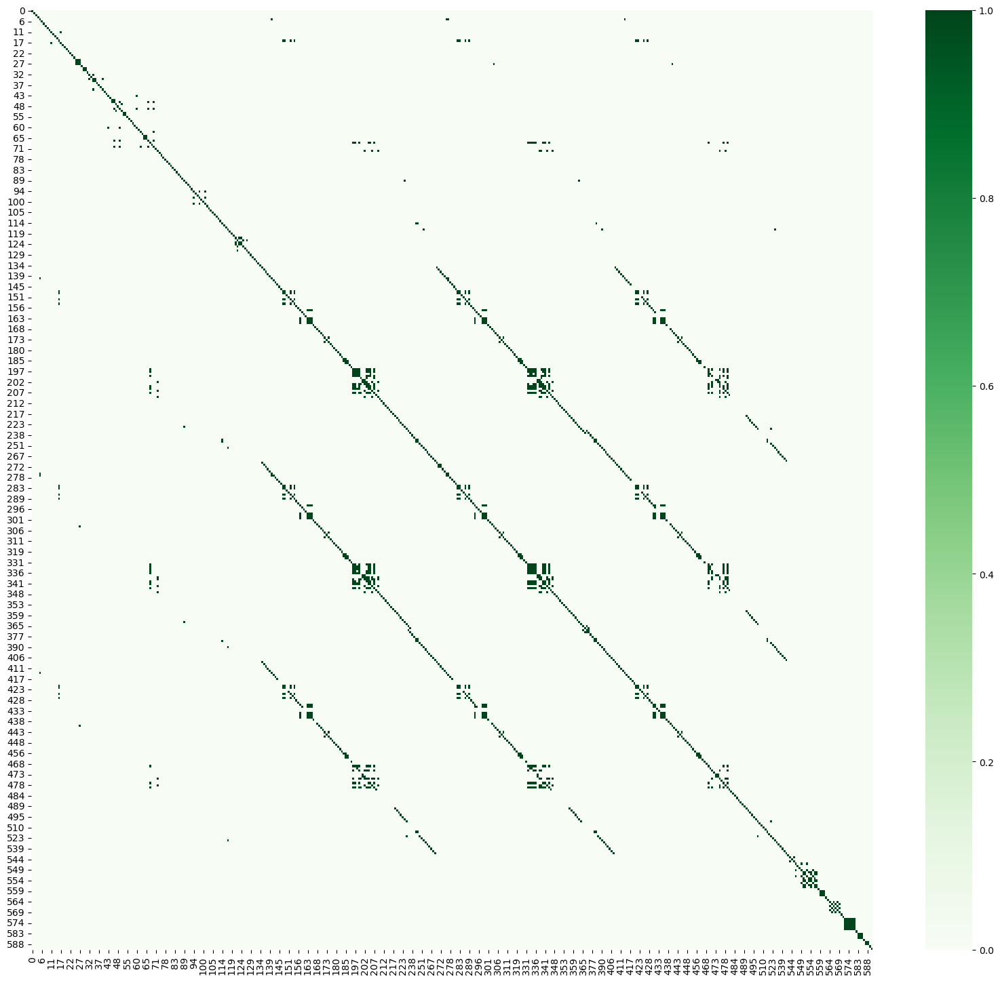

In [85]:
#checking for correlation matrix for all those features which has <0.7 correlation
plt.figure(figsize=(20,18))
corr=signal_df.corr()
sns.heatmap(abs(corr>0.7),cmap="Greens");

In [86]:

# Calculate correlation matrix
corr = signal_df.corr().abs()

# Get upper triangle of correlation matrix (excluding diagonal)
upper_triangle = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool_))

# Find columns with correlation greater than 60%
high_corr_cols = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.7)]

print("There are", len(high_corr_cols), "Columns with correlation greater than 70%:")

There are 241 Columns with correlation greater than 70%:


In [87]:
print(high_corr_cols)

['17', '22', '26', '27', '30', '34', '35', '36', '39', '46', '50', '51', '54', '60', '65', '66', '70', '96', '98', '101', '104', '105', '106', '123', '124', '125', '127', '130', '140', '147', '148', '152', '154', '155', '163', '164', '165', '174', '185', '187', '196', '197', '198', '199', '202', '203', '204', '205', '206', '207', '209', '224', '248', '249', '252', '254', '270', '271', '272', '273', '274', '275', '277', '278', '279', '280', '281', '282', '283', '285', '286', '287', '288', '289', '290', '291', '294', '295', '296', '297', '298', '299', '300', '301', '302', '303', '304', '305', '306', '307', '308', '309', '310', '311', '312', '316', '317', '318', '319', '320', '321', '323', '324', '331', '332', '333', '334', '335', '336', '337', '338', '339', '340', '341', '342', '343', '344', '347', '348', '349', '350', '351', '352', '353', '354', '355', '356', '357', '359', '360', '361', '362', '363', '365', '366', '367', '368', '376', '377', '386', '387', '388', '389', '390', '391', '39

In [88]:
# Drop features 
signal_df1 = signal_df.drop(high_corr_cols, axis=1)

In [89]:
signal_df1.shape

(1567, 202)

- We are able to drop 241 features who has high correlation(>70%) and left out with 202 features.

#### Q2D:  Check for multi-collinearity in the data and take necessary action.

In [90]:
from sklearn.model_selection import train_test_split
signal_df2 = signal_df1.copy()

# Copy all the predictor variables into X dataframe. Since 'mpg' is dependent variable drop it
X = signal_df2.drop('Pass/Fail', axis=1)

# Copy the 'mpg' column alone into the y dataframe. This is the dependent variable
y = signal_df2[['Pass/Fail']]

#x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [91]:
signal_df2.head()

,0,1,2,3,4,6,7,8,9,10,...,565,570,571,572,582,583,586,587,589,Pass/Fail
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,0.1242,1.5005,0.0162,-0.0034,...,0.14561,533.8500,2.1113,8.95,0.5005,0.0118,0.021458,0.016475,99.670066,-1
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,...,0.14561,535.0164,2.4335,5.92,0.5019,0.0223,0.009600,0.020100,208.204500,-1
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.4436,0.0041,0.0013,...,0.62190,535.0245,2.0293,11.21,0.4958,0.0157,0.058400,0.048400,82.860200,1
3,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.4882,-0.0124,-0.0033,...,0.16300,530.5682,2.0253,9.33,0.4990,0.0103,0.020200,0.014900,73.843200,-1
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.5031,-0.0031,-0.0072,...,0.14561,532.0155,2.0275,8.83,0.4800,0.4766,0.020200,0.014900,73.843200,-1


In [92]:
#Check for multi-collinearity using VIF threshold drop the features above the threshold.
from statsmodels.api import add_constant

# Compute the variance inflation factor (VIF) for each feature
def calculate_vif(data):
    vif_data = data.copy()
    vif_data = add_constant(data)
    vif_data['Intercept'] = 1  # Add an intercept column for VIF calculation
    vif_values = pd.DataFrame()
    vif_values["Feature"] = vif_data.columns
    vif_values["VIF"] = [variance_inflation_factor(vif_data.values, i) for i in range(vif_data.shape[1])]
    #vif_values["VIF"] = [variance_inflation_factor(vif_data.values, i) for i in range(len(data.columns))]
    return vif_values

In [93]:
# Check VIF for multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Check VIF for multicollinearity
vif_results = calculate_vif(X)

# Set a threshold for VIF to identify features with high multicollinearity
threshold_vif = 10

# Get the features with VIF above the threshold
high_vif_features = vif_results[vif_results['VIF'] > threshold_vif]['Feature'].tolist()

print("Features with high multicollinearity:")
print(high_vif_features)

Features with high multicollinearity:
['12', '14', '16', '18', '43', '45', '62', '63', '64', '67', '150', '423']


In [94]:
# Drop features with high multicollinearity
signal_df2.drop(high_vif_features, axis=1, inplace=True)
print("DataFrame after dropping features with high multicollinearity:")
print(signal_df2)

DataFrame after dropping features with high multicollinearity:
                0            1            2            3            4  \
0     3030.930000  2564.000000  2187.733300  1411.126500     1.360200   
1     3095.780000  2465.140000  2230.422200  1463.660600     0.829400   
2     2932.610000  2559.940000  2186.411100  1698.017200     1.510200   
3     2988.720000  2479.900000  2199.033300   909.792600     1.320400   
4     3032.240000  2502.870000  2233.366700  1326.520000     1.533400   
5     2946.250000  2432.840000  2233.366700  1326.520000     1.533400   
6     3030.270000  2430.120000  2230.422200  1463.660600     0.829400   
7     3058.880000  2690.150000  2248.900000  1004.469200     0.788400   
8     2967.680000  2600.470000  2248.900000  1004.469200     0.788400   
9     3016.110000  2428.370000  2248.900000  1004.469200     0.788400   
10    2994.050000  2548.210000  2195.122200  1046.146800     1.320400   
11    2928.840000  2479.400000  2196.211100  1605.757800     

In [95]:
signal_df2.shape

(1567, 190)

- With VIF method, we are able to remove 12 features with VIF>10. Now we are left with 190 features.

#### Q2E: Make all relevant modifications on the data using both functional/logical reasoning/assumptions.

- Originally dataset had 592 columns. 
- We removed all the data with features having 20% and above NULL values. With this number of features came down to 560(32
  features were removed).
- For the rest of the features having null values, we imputed with their mean values.
- Furthur, we identified 116 features having same values across all rows(std deviation 0) and dropped all those 116 features
  which will leave feature count as 444 remaining.
- Removed Time feature as it is irrelevant for this dataset predictions.
- Furthur checked for all those features having high correlation using correlation matrix. It seems that there are 241 features
  having correlation more than 70%. We dropped all those features and we are left out with 202 features.
- After this, we checked multicolinearity using Variance Inflation factor(VIF) technique with a VIF threshold of 10. Found 12
  features with high VIF(>10) and dropped them from the dataset.
- Final dataset features count stands at 190.
- We could furthur use PCA(Principal Component Analysis) techniques, Lasso technique to furthur reduce the irrelevant or less
  significant features.

### Q3: Data analysis & visualisation: 
#### Q3A:  Perform a detailed univariate Analysis with appropriate detailed comments after each analysis.

In [96]:
nunique = signal_df2.apply(pd.Series.nunique)
nunique

0            1521
1            1505
2             508
3             519
4             504
6             511
7              90
8            1209
9             569
10            393
11            379
15           1562
19            362
20            552
21           1296
23           1481
24           1495
25            705
28            870
29            189
31           1276
32            339
33            331
37            326
38            330
40            292
41            316
44           1377
47           1342
48           1487
53            154
55            108
56            188
57            160
58            383
59           1501
61           1419
68           1480
71           1558
74              3
75            676
76            892
77            843
78            996
79            692
80            923
81            581
82            889
83           1507
84            181
86            472
87            249
88            973
89            651
90           1514
91        

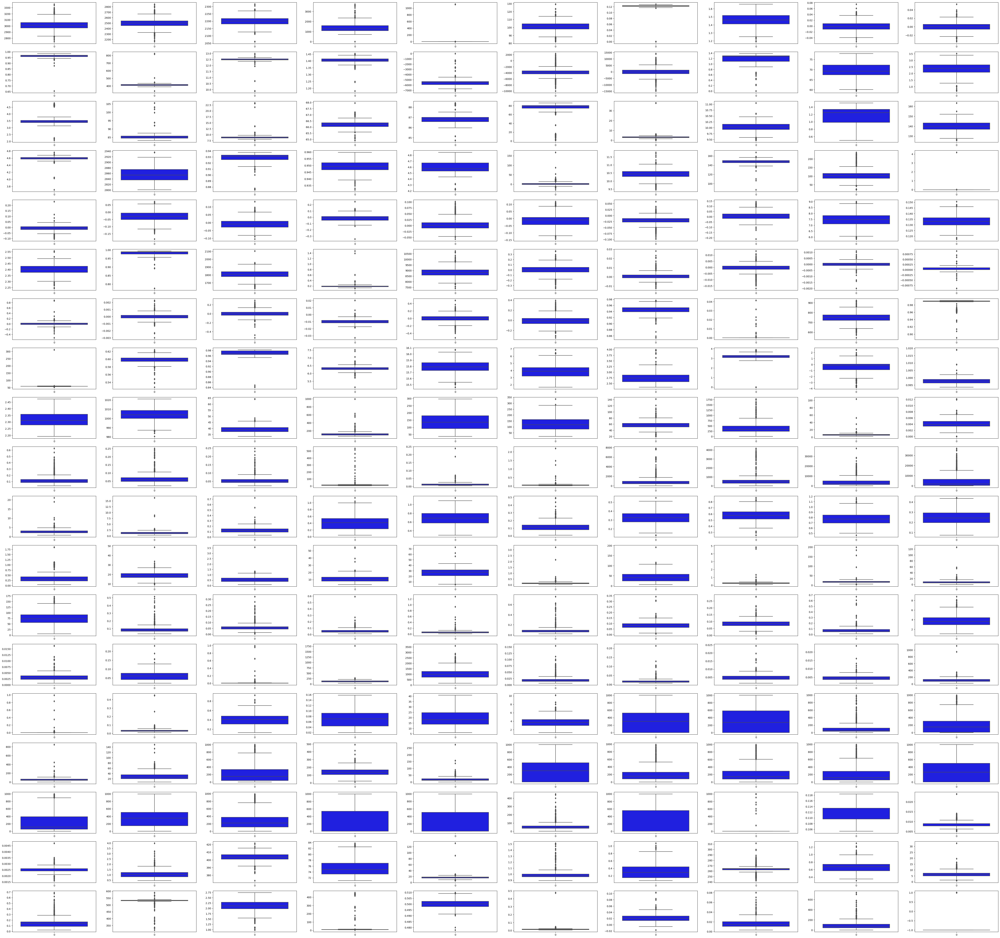

In [97]:
#Boxplot to check for outliers
plt.figure(figsize=(70, 70))
col = 1
for i in signal_df2.columns:
    plt.subplot(20,10, col)
    sns.boxplot(signal_df2[i],color='blue')
    col += 1

- Majority of the features have outliers. Lets replace them with outliers.

In [98]:
#find the outliers and replace them by median
for i in signal_df2.columns:
    if i != 'Pass/Fail':
        q1 = signal_df2[i].quantile(0.25)
        q3 = signal_df2[i].quantile(0.75)
        iqr = q3 - q1
    
        low = q1 - 1.5 * iqr
        high = q3 + 1.5 * iqr
    
        # Replace outliers with the median value of the column
        signal_df2[i] = signal_df2[i].where((signal_df2[i] >= low) & (signal_df2[i] <= high), signal_df2[i].median())
    
    #signal_df2.loc[(signal_df2[i] < low) | (signal_df2[i] > high), i] = signal_df2[i].median()

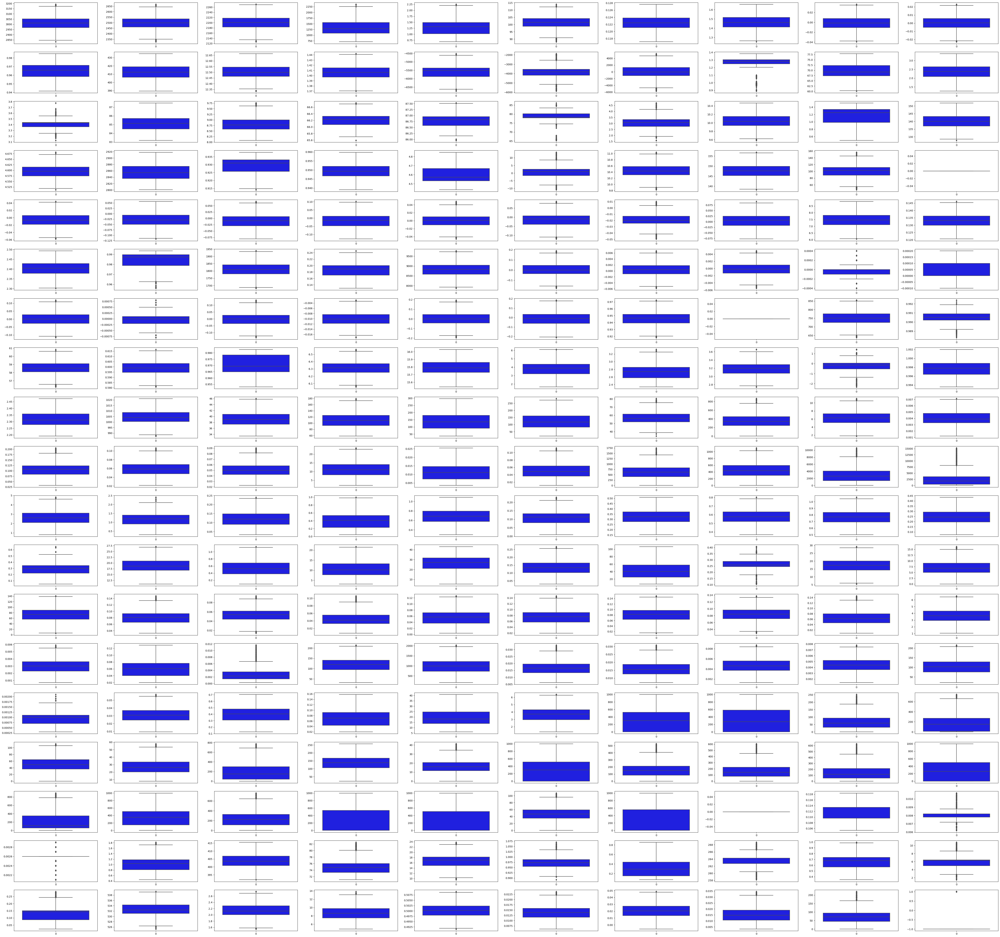

In [99]:
#After treating the outlier values
plt.figure(figsize=(70, 70))
col = 1
for i in signal_df2.columns:
    plt.subplot(20,10, col)
    sns.boxplot(signal_df2[i],color='blue')
    col += 1

In [100]:
nunique = signal_df2.apply(pd.Series.nunique)
nunique

0            1470
1            1418
2             496
3             502
4             488
6             475
7              87
8            1203
9             545
10            365
11            371
15           1555
19            346
20            523
21           1260
23           1287
24           1373
25            667
28            864
29            180
31            969
32            333
33            318
37            301
38            315
40            228
41            275
44           1346
47           1342
48           1480
53            137
55            107
56            174
57            153
58            373
59           1300
61           1357
68           1455
71           1439
74              1
75            641
76            876
77            809
78            979
79            608
80            879
81            444
82            843
83           1494
84            175
86            462
87            241
88            948
89            636
90           1478
91        

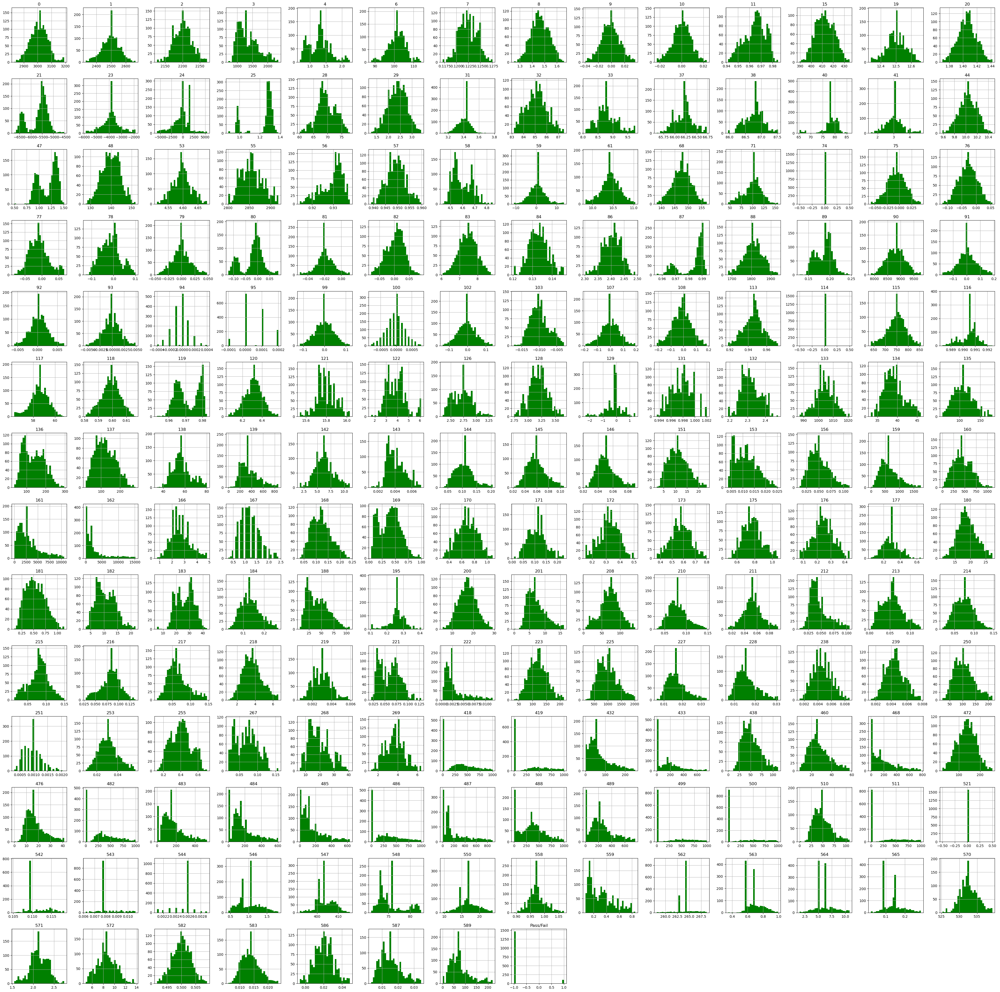

In [101]:
#plotting histogram to check for the frequency of values within a variable
signal_df2.hist(bins = 30, figsize = (50, 50), color = 'green')
plt.show();

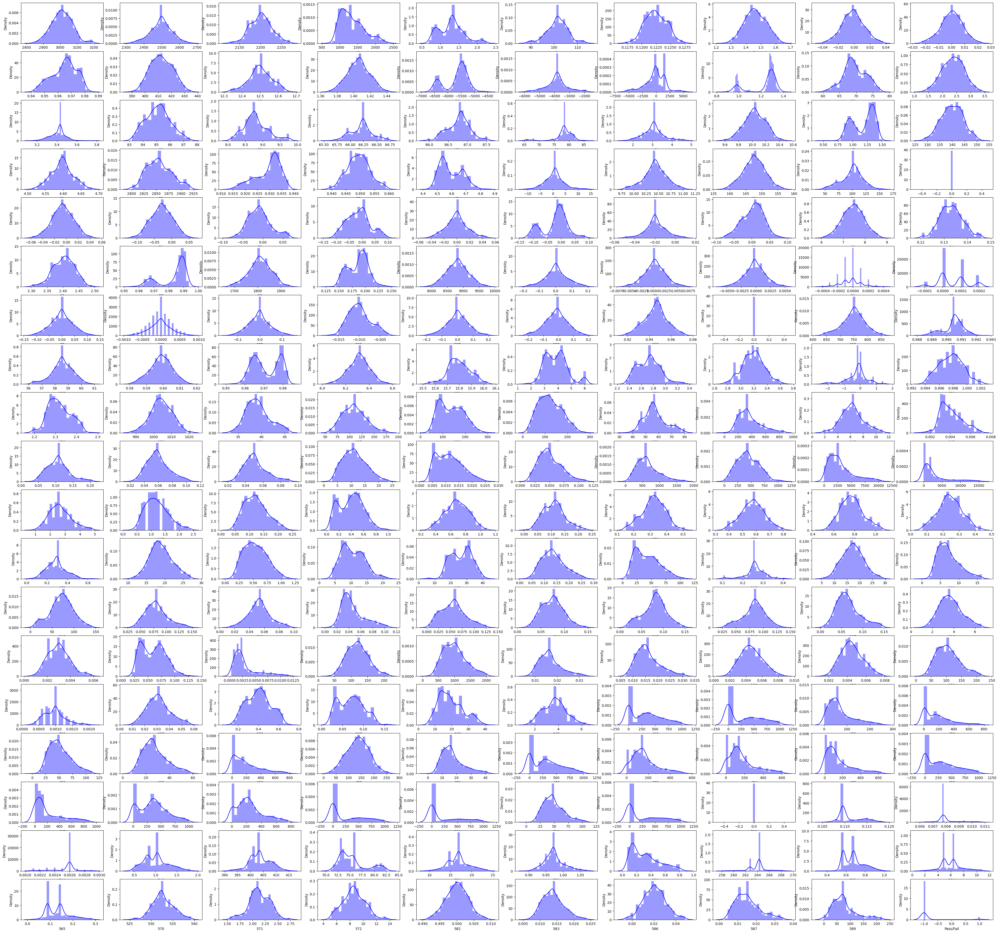

In [102]:
#density plot to check for the distribution of the variables
plt.figure(figsize=(50, 50))
col = 1
for i in signal_df2.columns:
    plt.subplot(20, 10, col)
    sns.distplot(signal_df2[i], color = 'b')
    col += 1 

- Most of the features are normally distributed.
- Few features have constant values post outlier treatment.
- Few features have data skewed towards right.
- Looks like few features have discrete data type.

 #### Q3B: Perform bivariate and multivariate analysis with appropriate detailed comments after each analysis. 

In [103]:
#plotting histogram to check for the frequency of values within a variable
#signal_df2.hist(bins = 30, figsize = (50, 50), color = 'green')
#sns.pairplot(data=signal_df2, diag_kind="kde")
#plt.show();

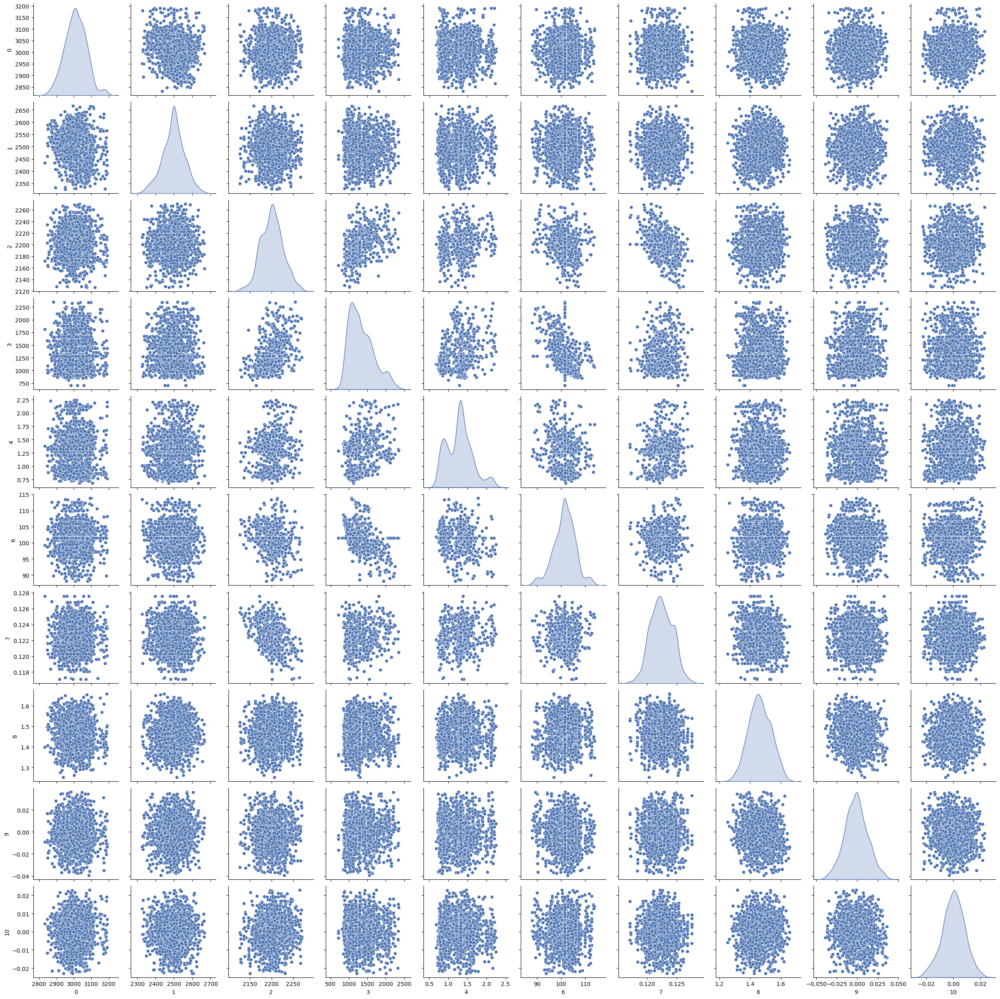

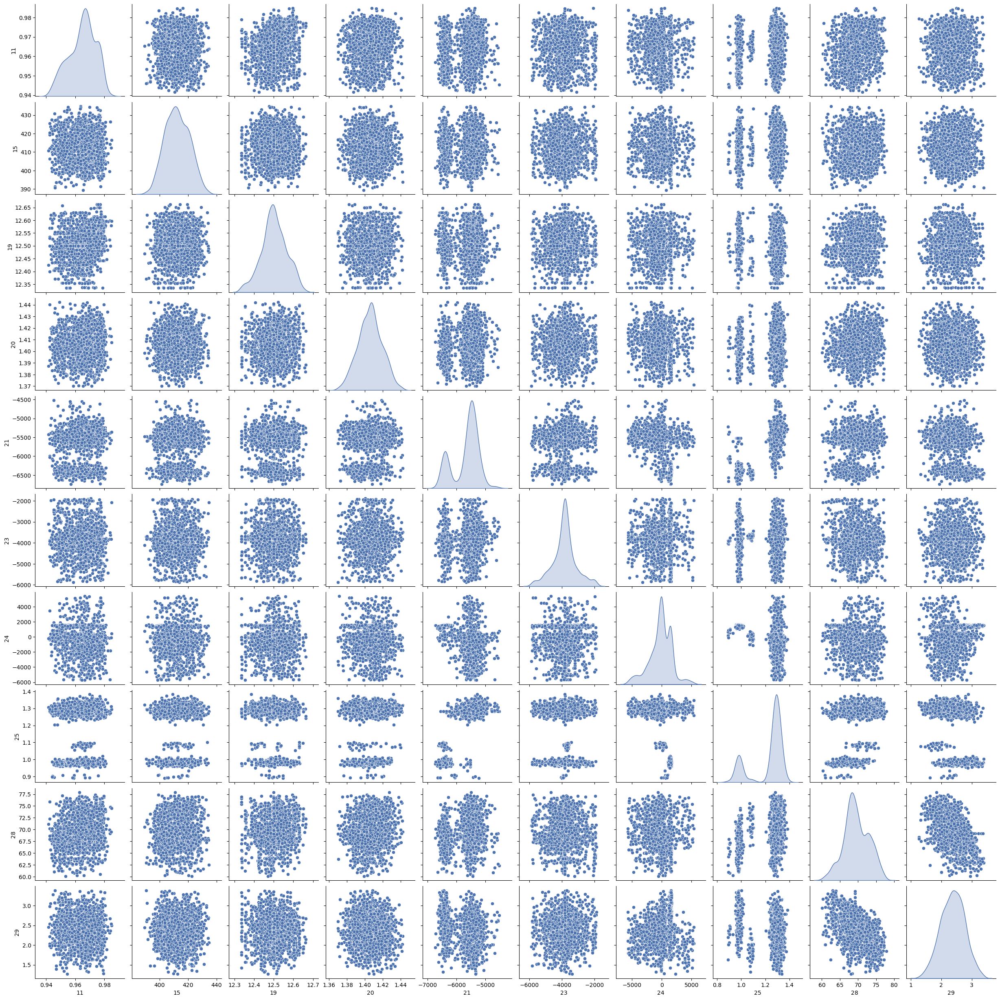

In [104]:
# Define the number of columns per pairplot
columns_per_pairplot = 10
#Get the size of DataFrame columns
num_rows, num_columns = signal_df2.shape
num_columns = 20

# Create pairplots for different ranges of columns
for i in range(0, num_columns, columns_per_pairplot):
    selected_columns = signal_df2.columns[i:i + columns_per_pairplot]
    sns.pairplot(signal_df2[selected_columns], diag_kind="kde")
    plt.show()

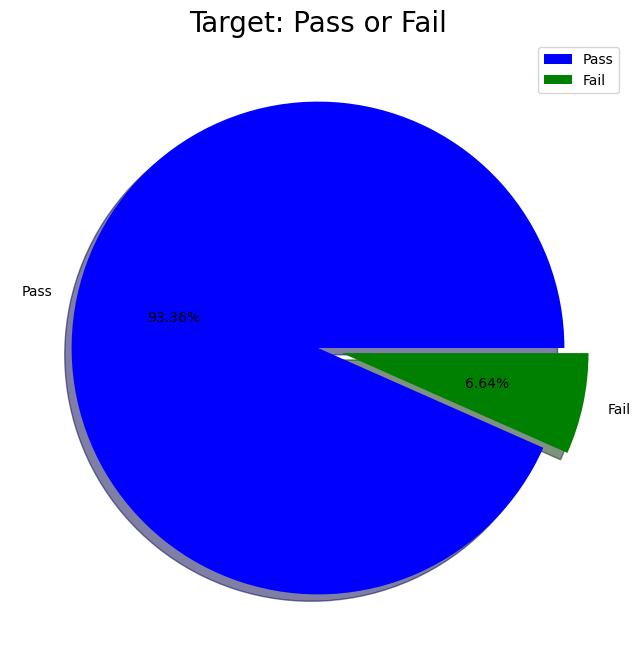

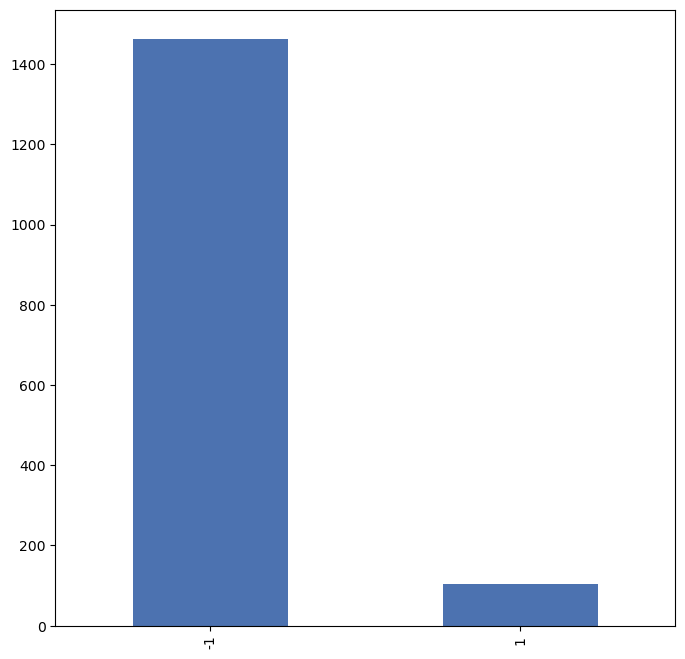

In [105]:
# pie chart for target feature 'Pass/Fail'

labels = ['Pass', 'Fail']
size = signal_df2['Pass/Fail'].value_counts()
colors = ['blue', 'green']
explode = [0, 0.1]

plt.style.use('seaborn-deep')
plt.rcParams['figure.figsize'] = (8, 8)
plt.pie(size, labels =labels, colors = colors, explode = explode, autopct = "%.2f%%", shadow = True)
plt.axis('off')
plt.title('Target: Pass or Fail', fontsize = 20)
plt.legend()
plt.show()
signal_df2['Pass/Fail'].value_counts().plot(kind="bar");

Text(0.5, 1.0, 'Correlation heatmap for the Data')

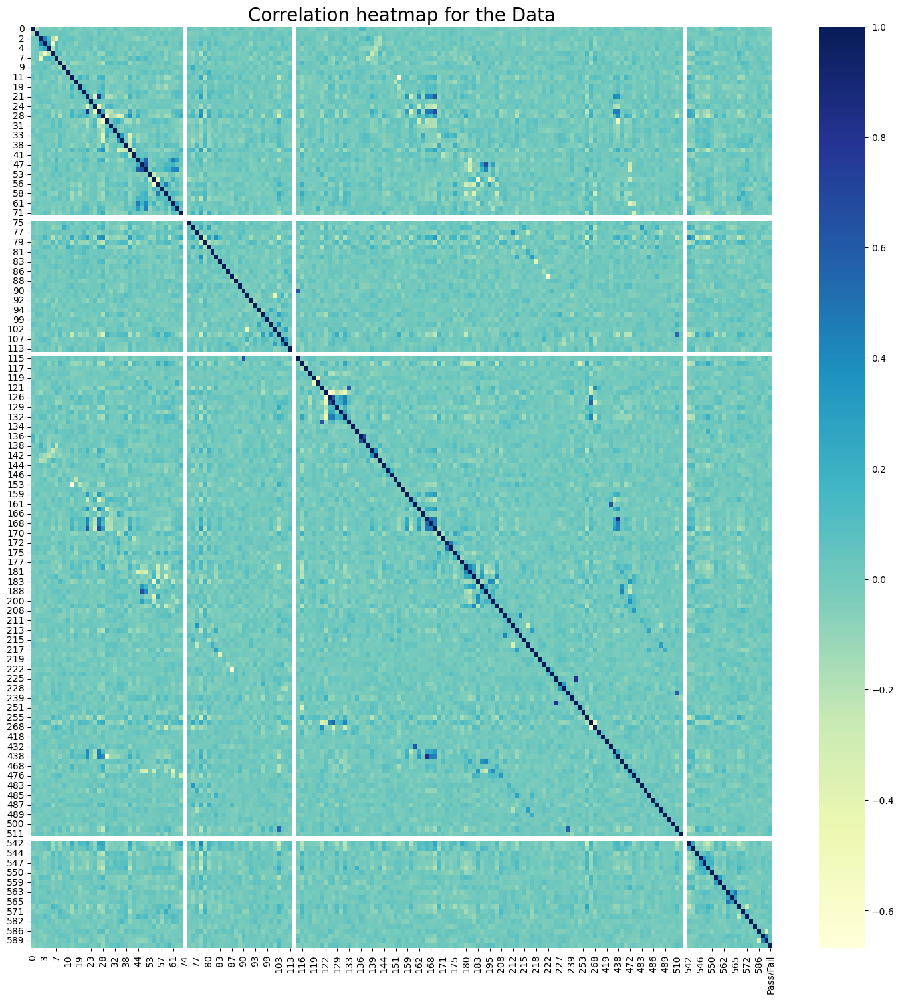

In [106]:
# heatmap to get correlation

plt.rcParams['figure.figsize'] = (18, 18)
sns.heatmap(signal_df2.corr(), cmap = "YlGnBu")
plt.title('Correlation heatmap for the Data', fontsize = 20)

- Seems like some variables still have 0 as a constant signal(std deviation 0). We will be dropping them after scaling with z-score(features 74, 114, 521).
- Most of the features doesnt have any correlation. This is also because we had done the cleanup of all those features who has correlation more than 70% and VIF threshold greater than 10.
- Target feature is highly imbalanced with 93.36% Pass and 6.64% Fail.


In [107]:
nunique = signal_df2.apply(pd.Series.nunique)
nunique

0            1470
1            1418
2             496
3             502
4             488
6             475
7              87
8            1203
9             545
10            365
11            371
15           1555
19            346
20            523
21           1260
23           1287
24           1373
25            667
28            864
29            180
31            969
32            333
33            318
37            301
38            315
40            228
41            275
44           1346
47           1342
48           1480
53            137
55            107
56            174
57            153
58            373
59           1300
61           1357
68           1455
71           1439
74              1
75            641
76            876
77            809
78            979
79            608
80            879
81            444
82            843
83           1494
84            175
86            462
87            241
88            948
89            636
90           1478
91        

In [108]:
# Identify features with the same value for all rows
drop_features = [col for col in signal_df2.columns if signal_df2[col].nunique() == 1]
len(drop_features)

3

In [109]:
# Drop features with the same value for all rows
signal_df2.drop(drop_features, axis=1, inplace=True)

In [110]:
signal_df2.shape

(1567, 187)

In [111]:
# again, checking if there is any NULL values left.
signal_df2.isnull().any().any()

False

In [112]:
#label encoding the target class
signal_df2['Pass/Fail']=signal_df2['Pass/Fail'].replace([-1,1],[0,1])

#### Q4: Data pre-processing:
#### Q4A: Segregate predictors vs target attributes

In [113]:
from sklearn.model_selection import train_test_split
df_final = signal_df2.copy() #Make a copy of the final cleaned dataset.

#splitting the dataset into train and validation set(20% for validation set)
X=df_final.iloc[0:1254,:]
val=df_final.iloc[1254:,:]
val=val.drop(['Pass/Fail'],axis=1)

#creating a copy of the train data and seperating the target column and the predictor variables
X_copy = X.copy()
X=X_copy.drop(['Pass/Fail'],axis=1)
y=X_copy['Pass/Fail']

In [114]:
row,column=val.shape
print('The reduced validation dataset contains', row, 'rows and', column, 'columns')

The reduced validation dataset contains 313 rows and 186 columns


In [115]:
row,column=X.shape
print('The reduced training dataset contains', row, 'rows and', column, 'columns')

The reduced training dataset contains 1254 rows and 186 columns


In [116]:
#splitting data training dataset into train and test set for independent attributes
#X_train, X_test, Y_train, Y_test =train_test_split(X,y, test_size=.30,random_state=105,stratify=y)

#### Q4B: Check for target balancing and fix it if found imbalanced.
#### Q4C: Perform train-test split and standardise the data or vice versa if required.
#### Q4D: Check if the train and test data have similar statistical characteristics when compared with original data. 
#### Q4E: Display and explain the classification report in detail.
#### Q4F:  Apply the above steps for all possible models that you have learnt so far.

#### Note: Pls find the answers for all the questions from Q4B through Q4F in the following code walk and explanations as its but tricky to explain and answer question wise but it has all the aspects covered.

- As shown earlier in the pie chart for Pass/Fail distribution of target class, it was noticed that data is highly imbalanced with Pass at 93.36% and Fail at 6.64%

- Split the data into train and test dataset in 70:30 ratio.

In [117]:
# splitting data training dataset into train and test set for independent attributes
X_train, X_test, y_train, y_test =train_test_split(X,y, test_size=.30,random_state=105,stratify=y)

In [118]:
print("Training Fail    : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 1]), (len(y_train[y_train[:] == 1])/len(y_train)) * 100))
print("Training Pass  : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 0]), (len(y_train[y_train[:] == 0])/len(y_train)) * 100))
print("")
print("Test Fail        : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 1]), (len(y_test[y_test[:] == 1])/len(y_test)) * 100))
print("Test Pass       : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 0]), (len(y_test[y_test[:] == 0])/len(y_test)) * 100))
print("")

Training Fail    : 61 (6.96%)
Training Pass  : 816 (93.04%)

Test Fail        : 26 (6.90%)
Test Pass       : 351 (93.10%)



-  Data is highly imbalanced 

In [119]:
#scaling the data(Train, Test, Validation) with z-score
X_train_z = X_train.apply(zscore)
X_test_z = X_test.apply(zscore)
val_z = val.apply(zscore)
X_train_z.describe().T

,count,mean,std,min,25%,50%,75%,max
0,877.0,6.977821e-15,1.000571,-2.994727,-0.724527,-0.009687,0.715419,2.942235
1,877.0,1.272009e-15,1.000571,-2.738377,-0.621345,0.023572,0.611047,2.750926
2,877.0,-1.018823e-15,1.000571,-2.746324,-0.770549,-0.030039,0.667818,2.503450
3,877.0,7.696871e-17,1.000571,-1.446813,-0.827867,-0.222668,0.654268,2.730934
4,877.0,1.225423e-16,1.000571,-1.717160,-0.799405,0.050732,0.569236,2.848871
6,877.0,-2.124742e-15,1.000571,-3.189605,-0.572942,0.021103,0.658116,2.460238
7,877.0,1.835096e-15,1.000571,-2.828236,-0.714627,-0.064286,0.748641,2.862250
8,877.0,-9.398285e-16,1.000571,-2.619488,-0.741130,-0.051568,0.769756,2.489999
9,877.0,8.101970e-18,1.000571,-2.527276,-0.667558,0.001104,0.669766,2.613066
10,877.0,-1.417845e-17,1.000571,-2.872804,-0.628196,0.013121,0.691436,2.775715


#### Lets first train algorithm without any sampling

In [120]:
# Initializaing various classification algorithms with normal dataset and choosing the best model based on f1 score for tuning

models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("SVM", SVC(kernel='linear')))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("AB", AdaBoostClassifier()))
models.append(("GBT", GradientBoostingClassifier()))


#testing models
results = []
names = []
display = []

for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=55,shuffle=True)
    cv_results = cross_val_score(model, X_train_z, y_train, cv=kfold, scoring='f1')
    results.append(cv_results)
    names.append(name)
    msg = 'On Normal Dataset %s: MeanAccuracy %f%% (SD: %f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    print(msg)
    display.append(msg)

On Normal Dataset LR: MeanAccuracy 13.563564% (SD: 11.989809%)
On Normal Dataset KNN: MeanAccuracy 7.857143% (SD: 12.037357%)
On Normal Dataset GNB: MeanAccuracy 17.922900% (SD: 10.484676%)
On Normal Dataset SVM: MeanAccuracy 15.256093% (SD: 9.623869%)
On Normal Dataset DT: MeanAccuracy 13.930744% (SD: 8.577098%)
On Normal Dataset RF: MeanAccuracy 0.000000% (SD: 0.000000%)
On Normal Dataset AB: MeanAccuracy 6.222222% (SD: 13.063945%)
On Normal Dataset GBT: MeanAccuracy 6.111111% (SD: 9.444444%)


#### Lets try Random Undersampling Technique

In [121]:
# Implementing random under sampling
under= RandomUnderSampler(sampling_strategy=0.5)
X_under, y_under= under.fit_resample(X_train_z, y_train)

In [122]:
print("Under Training Fail    : {0} ({1:0.2f}%)".format(len(y_under[y_under[:] == 1]), (len(y_under[y_under[:] == 1])/len(y_under)) * 100))
print("under Training Pass  : {0} ({1:0.2f}%)".format(len(y_under[y_under[:] == 0]), (len(y_under[y_under[:] == 0])/len(y_under)) * 100))
                                                                                                   

Under Training Fail    : 61 (33.33%)
under Training Pass  : 122 (66.67%)


In [123]:
# Initializaing various classification algorithms with random under sampler dataset and choosing the best model based on f1 score

models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("SVM", SVC(kernel='linear')))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("AB", AdaBoostClassifier()))
models.append(("GBT", GradientBoostingClassifier()))

#testing models
results = []
names = []

for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=66,shuffle=True)
    cv_results = cross_val_score(model, X_under, y_under, cv=kfold, scoring='f1')
    results.append(cv_results)
    names.append(name)
    msg = 'With Random Undersampling, %s: MeanAccuracy %f%% (SD: %f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    print(msg)

With Random Undersampling, LR: MeanAccuracy 33.550505% (SD: 14.003003%)
With Random Undersampling, KNN: MeanAccuracy 42.216783% (SD: 20.087437%)
With Random Undersampling, GNB: MeanAccuracy 48.636364% (SD: 16.406153%)
With Random Undersampling, SVM: MeanAccuracy 36.388889% (SD: 15.586435%)
With Random Undersampling, DT: MeanAccuracy 44.950549% (SD: 14.156398%)
With Random Undersampling, RF: MeanAccuracy 16.579365% (SD: 18.128431%)
With Random Undersampling, AB: MeanAccuracy 32.814519% (SD: 9.966785%)
With Random Undersampling, GBT: MeanAccuracy 32.875180% (SD: 26.044887%)


#### Lets try SMOTE Technique and check results using KFold CV method:


In [124]:
# Implementing SMOTE
smt = SMOTE(sampling_strategy=0.5)
X_SMOTE, y_SMOTE = smt.fit_resample(X_train_z, y_train)

In [125]:
print("SMOTE Training Fail    : {0} ({1:0.2f}%)".format(len(y_SMOTE[y_SMOTE[:] == 1]), (len(y_SMOTE[y_SMOTE[:] == 1])/len(y_SMOTE)) * 100))
print("SMOTE Training Pass  : {0} ({1:0.2f}%)".format(len(y_SMOTE[y_SMOTE[:] == 0]), (len(y_SMOTE[y_SMOTE[:] == 0])/len(y_SMOTE)) * 100))

SMOTE Training Fail    : 408 (33.33%)
SMOTE Training Pass  : 816 (66.67%)


In [126]:
# Initializaing various classification algorithms with Smote dataset and choosing the best model based on f1 score

models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("SVM", SVC(kernel='linear')))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("AB", AdaBoostClassifier()))
models.append(("GBT", GradientBoostingClassifier()))

#testing models
results = []
names = []
for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=25,shuffle=True)
    cv_results = cross_val_score(model, X_SMOTE, y_SMOTE, cv=kfold, scoring='f1')
    results.append(cv_results)
    names.append(name)
    msg = 'With SMOTE Technique %s: Mean Accuracy %f%% (SD: %f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    display.append(msg)
    print(msg)

With SMOTE Technique LR: Mean Accuracy 84.855052% (SD: 3.136641%)
With SMOTE Technique KNN: Mean Accuracy 52.738358% (SD: 1.283949%)
With SMOTE Technique GNB: Mean Accuracy 82.589230% (SD: 5.189208%)
With SMOTE Technique SVM: Mean Accuracy 86.071061% (SD: 2.030649%)
With SMOTE Technique DT: Mean Accuracy 78.027069% (SD: 4.586727%)
With SMOTE Technique RF: Mean Accuracy 95.899510% (SD: 1.824272%)
With SMOTE Technique AB: Mean Accuracy 89.353498% (SD: 3.452413%)
With SMOTE Technique GBT: Mean Accuracy 94.299898% (SD: 2.155798%)


#### Lets check with Random oversampling and KFold method and see the result:

In [127]:
# Implementing random over sampling
over= RandomOverSampler(sampling_strategy=0.5)
X_over, y_over= over.fit_resample(X_train_z, y_train)

In [128]:
print("over Training Fail    : {0} ({1:0.2f}%)".format(len(y_over[y_over[:] == 1]), (len(y_over[y_over[:] == 1])/len(y_over)) * 100))
print("over Training Pass  : {0} ({1:0.2f}%)".format(len(y_over[y_over[:] == 0]), (len(y_over[y_over[:] == 0])/len(y_over)) * 100))

over Training Fail    : 408 (33.33%)
over Training Pass  : 816 (66.67%)


In [129]:
# Initializaing various classification algorithms with over sampled dataset and choosing the best model based on f1 score

models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("SVM", SVC(kernel='linear')))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("AB", AdaBoostClassifier()))
models.append(("GBT", GradientBoostingClassifier()))

#testing models
results = []
names = []


for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=69,shuffle=True)
    cv_results = cross_val_score(model, X_over, y_over, cv=kfold, scoring='f1')
    results.append(cv_results)
    names.append(name)
    msg = 'Random Oversampling %s: Mean Accuracy %f%% (SD: %f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    display.append(msg)
    print(msg)

Random Oversampling LR: Mean Accuracy 85.353130% (SD: 3.153868%)
Random Oversampling KNN: Mean Accuracy 85.643238% (SD: 2.545508%)
Random Oversampling GNB: Mean Accuracy 67.253900% (SD: 3.863360%)
Random Oversampling SVM: Mean Accuracy 85.985010% (SD: 2.028315%)
Random Oversampling DT: Mean Accuracy 92.292748% (SD: 1.652649%)
Random Oversampling RF: Mean Accuracy 99.749961% (SD: 0.500127%)
Random Oversampling AB: Mean Accuracy 92.478030% (SD: 2.859371%)
Random Oversampling GBT: Mean Accuracy 98.671255% (SD: 0.830961%)


#### Lets check Gaussian Naive Bayes on Normal Dataset

In [130]:
nb = GaussianNB()
nb.fit(X_train_z, y_train)

GaussianNB()

In [131]:
modelnb_score = nb.score(X_train_z, y_train)
print('Accuracy Score of Training Data: ', modelnb_score)

Accuracy Score of Training Data:  0.8574686431014823


In [132]:
y_predictnb= nb.predict(X_test_z)
modelnb_score = accuracy_score(y_test, y_predictnb)
print('Accuracy Score of Test Data:', modelnb_score)

Accuracy Score of Test Data: 0.8063660477453581


In [133]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, y_predictnb, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.14      0.35      0.20        26
           0       0.95      0.84      0.89       351

    accuracy                           0.81       377
   macro avg       0.54      0.59      0.54       377
weighted avg       0.89      0.81      0.84       377



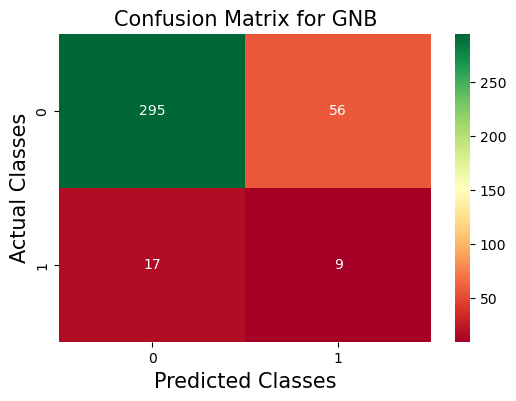

In [134]:
# visualizing confusion matrix
cm= confusion_matrix(y_test, y_predictnb)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.xlabel('Predicted Classes', fontsize = 15)
plt.ylabel('Actual Classes', fontsize = 15)
plt.title('Confusion Matrix for GNB', fontsize = 15);

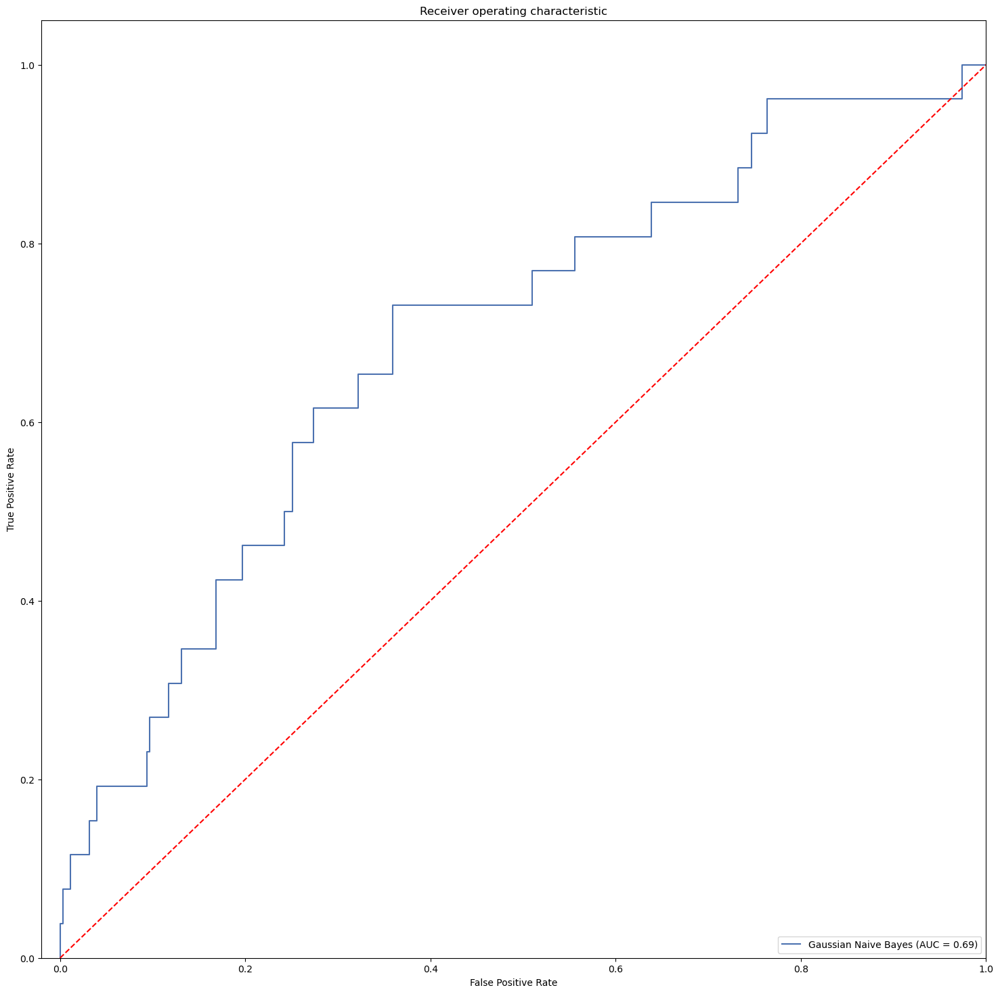

In [135]:
#Plotting ROC and AUC
probs = nb.predict_proba(X_test_z)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc_nb = metrics.auc(fpr, tpr)
plt.plot(fpr, tpr, label='Gaussian Naive Bayes (AUC = %0.2f)' % roc_auc_nb)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [136]:
i = np.arange(len(tpr)) # index for df
roc = pd.DataFrame({'fpr' : pd.Series(fpr, index=i),'tpr' : pd.Series(tpr, index = i), '1-fpr' : pd.Series(1-fpr, index = i), 'tf' : pd.Series(tpr - (1-fpr), index = i), 'threshold' : pd.Series(threshold, index = i)})
print(roc.loc[(roc.tf-0).abs().argsort()[:1]])

         fpr       tpr     1-fpr        tf  threshold
30  0.358974  0.653846  0.641026  0.012821   0.011494


In [137]:
       # proba_tr = clf.predict_proba(X_train)
        #proba_test = clf.predict_proba(X_test)
    
        #y_pred_tr = binarize(proba_tr, threshold = thresh)[:,1] 
        #y_pred_test = binarize(proba_test, threshold = thresh)[:,1] 

In [138]:
# store the predicted probabilities for Failed Class. 
y_pred_prob = nb.predict_proba(X_test_z)[:, 1]
thresh = 0.0114

#y_pred_class = binarize([y_pred_prob], 0.0114)[0]
y_pred_class = binarize([y_pred_prob], threshold = thresh)[0]

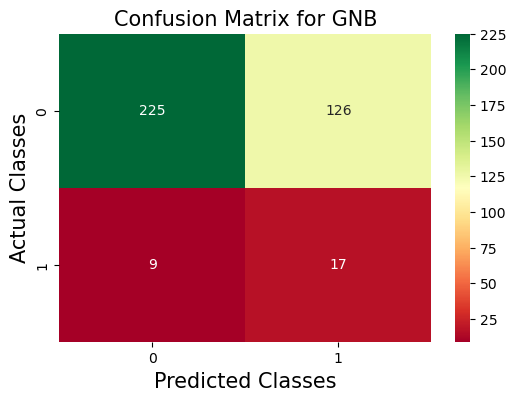

In [139]:
# visualizing confusion matrix
cm= confusion_matrix(y_test, y_pred_class)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for GNB', fontsize = 15);

In [140]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, y_pred_class, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.12      0.65      0.20        26
           0       0.96      0.64      0.77       351

    accuracy                           0.64       377
   macro avg       0.54      0.65      0.49       377
weighted avg       0.90      0.64      0.73       377



In [141]:
precision_nb, recall_nb, f1_score_nb, support = precision_recall_fscore_support(y_test, y_pred_class, average = 'macro')
print('Precision Score :', '%0.2f' % precision_nb)
print('Recall Score :', '%0.2f' % recall_nb)
print('F1-Score:', '%0.2f' % f1_score_nb)
nb_acc= accuracy_score(y_test, y_predictnb)
print('Accuracy Score :','%0.2f' % nb_acc)
print('AUC :','%0.2f' % roc_auc_nb)
print('Thresholdnb :','%0.4f' % thresh)
Thresholdnb = thresh

Precision Score : 0.54
Recall Score : 0.65
F1-Score: 0.49
Accuracy Score : 0.81
AUC : 0.69
Thresholdnb : 0.0114


#### Gaussian Naive Bayes on Under sampled Data

In [142]:
nbu = GaussianNB()
nbu.fit(X_under, y_under)

GaussianNB()

In [143]:
modelnbu_score = nbu.score(X_under,y_under)
print('Accuracy Score of Training Data: ', modelnbu_score)

Accuracy Score of Training Data:  0.819672131147541


In [144]:
y_predictnbu= nbu.predict(X_test_z)
modelnbu_score = accuracy_score(y_test, y_predictnbu)
print('Accuracy Score of Test Data:', modelnbu_score)

Accuracy Score of Test Data: 0.6657824933687002


In [145]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, y_predictnbu, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.13      0.69      0.22        26
           0       0.97      0.66      0.79       351

    accuracy                           0.67       377
   macro avg       0.55      0.68      0.50       377
weighted avg       0.91      0.67      0.75       377



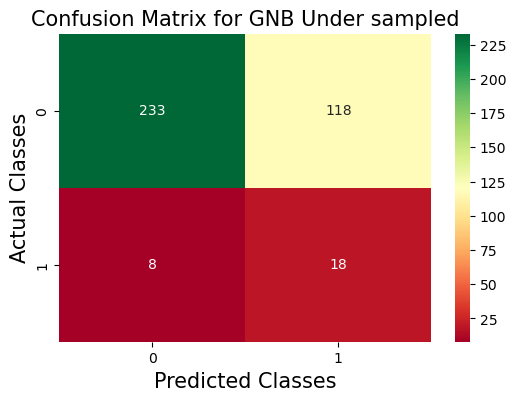

In [146]:
# visualizing confusion matrix
cm= confusion_matrix(y_test, y_predictnbu)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for GNB Under sampled', fontsize = 15);

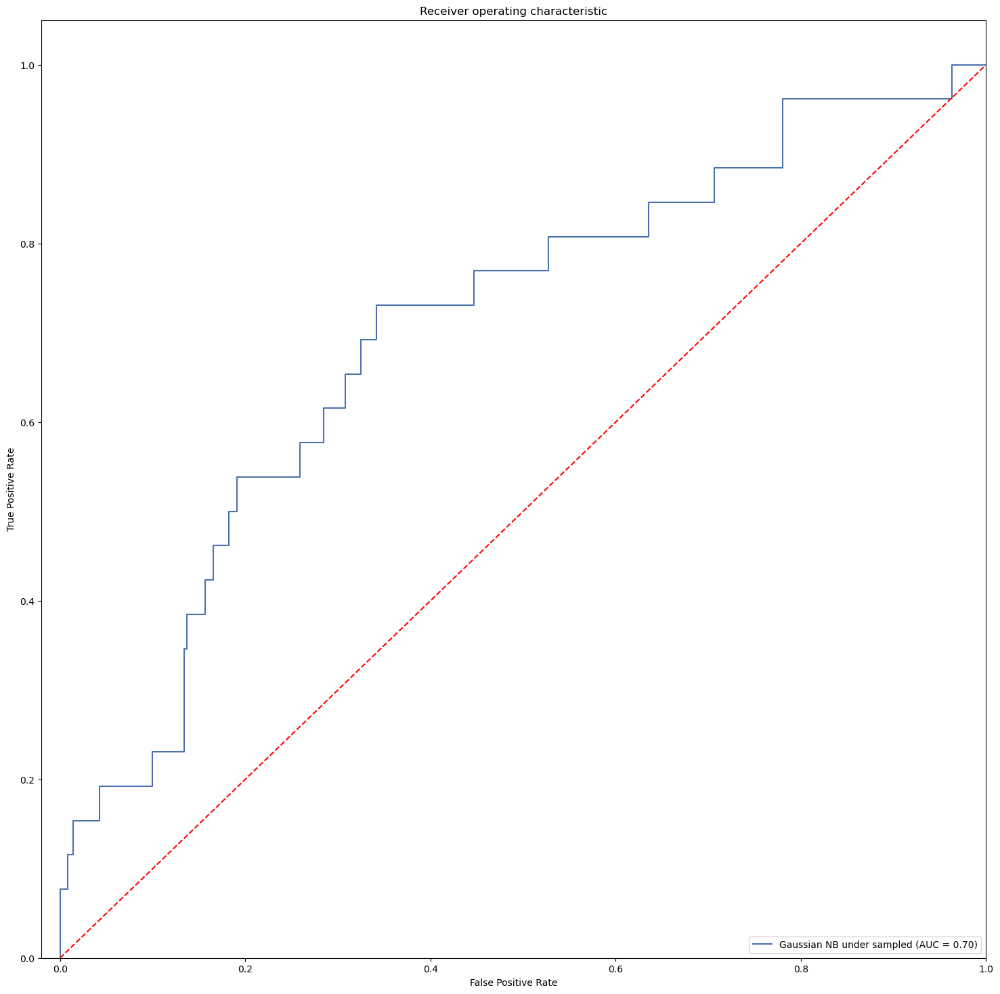

In [147]:
#Plotting ROC and AUC
probs = nbu.predict_proba(X_test_z)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc_nbu = metrics.auc(fpr, tpr)
plt.plot(fpr, tpr, label='Gaussian NB under sampled (AUC = %0.2f)' % roc_auc_nbu)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [148]:
i = np.arange(len(tpr)) # index for df
roc = pd.DataFrame({'fpr' : pd.Series(fpr, index=i),'tpr' : pd.Series(tpr, index = i), '1-fpr' : pd.Series(1-fpr, index = i), 'tf' : pd.Series(tpr - (1-fpr), index = i), 'threshold' : pd.Series(threshold, index = i)})
print(roc.loc[(roc.tf-0).abs().argsort()[:1]])

         fpr       tpr     1-fpr        tf  threshold
30  0.324786  0.692308  0.675214  0.017094   0.603341


In [169]:
thresh = 0.6033
# store the predicted probabilities for failed class 
y_pred_prob = nbu.predict_proba(X_test_z)[:, 1]
# predict fail if the predicted probability is greater than 0.1577
y_pred_class = binarize([y_pred_prob], threshold = thresh)[0]

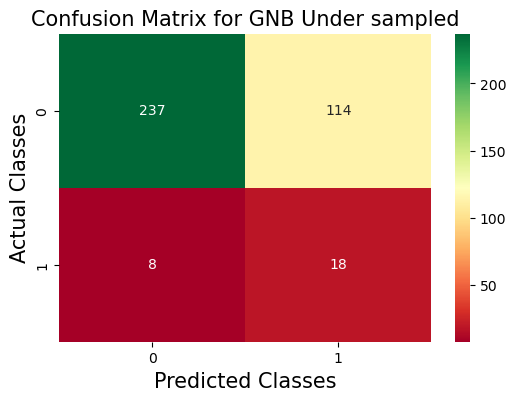

In [170]:
# visualizing confusion matrix
cm= confusion_matrix(y_test, y_pred_class)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for GNB Under sampled', fontsize = 15);

In [171]:
precision_nbu, recall_nbu, f1_score_nbu, support = precision_recall_fscore_support(y_test, y_pred_class, average = 'macro')
print('Precision Score :', '%0.2f' % precision_nbu)
print('Recall Score :', '%0.2f' % recall_nbu)
print('F1-Score:', '%0.2f' % f1_score_nbu)
nbu_acc= accuracy_score(y_test, y_predictnbu)
print('Accuracy Score :','%0.2f' % nbu_acc)
print('AUC :','%0.2f' % roc_auc_nbu)
print('Thresholdnbu:','%0.4f' % thresh)
Thresholdnbu = thresh

Precision Score : 0.55
Recall Score : 0.68
F1-Score: 0.51
Accuracy Score : 0.67
AUC : 0.70
Thresholdnbu: 0.6033


#### RandomForest on Random over sampled Dataset

In [152]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 500, num = 50)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = range(2,100,5)
# Minimum number of samples required at each leaf node
min_samples_leaf = range(1,100,10)
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
                'criterion':['gini','entropy']}

In [153]:
rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, cv = 5, verbose=2, random_state=90, n_jobs = -1)
rf_random.fit(X_over, y_over)
rf_random.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits


{'n_estimators': 463,
 'min_samples_split': 82,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 110,
 'criterion': 'gini',
 'bootstrap': False}

In [154]:
rf_grid1 = RandomForestClassifier(n_estimators=463,
 min_samples_split= 82,
 min_samples_leaf=1,
 max_features= 'sqrt',
 max_depth= 110,
 criterion= 'gini',
 bootstrap= False)
rf_grid1.fit(X_over, y_over)

RandomForestClassifier(bootstrap=False, max_depth=110, min_samples_split=82,
                       n_estimators=463)

In [155]:
modelrfg1_score=rf_grid1.score(X_over,y_over)
print('Accuracy Score of Training Data: ', modelrfg1_score)

Accuracy Score of Training Data:  0.9983660130718954


In [156]:
y_predictrfg1= rf_grid1.predict(X_test_z)
modelrfg1_score = accuracy_score(y_test, y_predictrfg1)
print('Accuracy Score of Test Data:', modelrfg1_score)

Accuracy Score of Test Data: 0.9310344827586207


In [157]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, y_predictrfg1, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        26
           0       0.93      1.00      0.96       351

    accuracy                           0.93       377
   macro avg       0.47      0.50      0.48       377
weighted avg       0.87      0.93      0.90       377



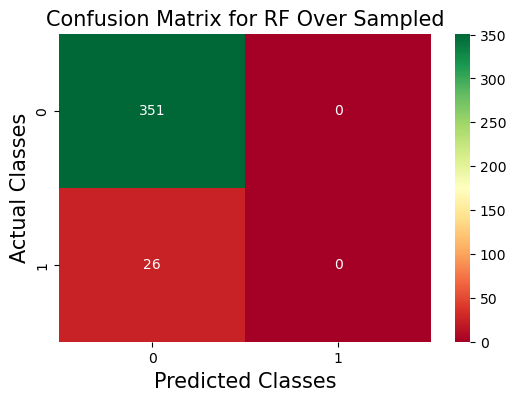

In [158]:
# visualizing confusion matrix
cm= confusion_matrix(y_test, y_predictrfg1)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for RF Over Sampled', fontsize = 15);

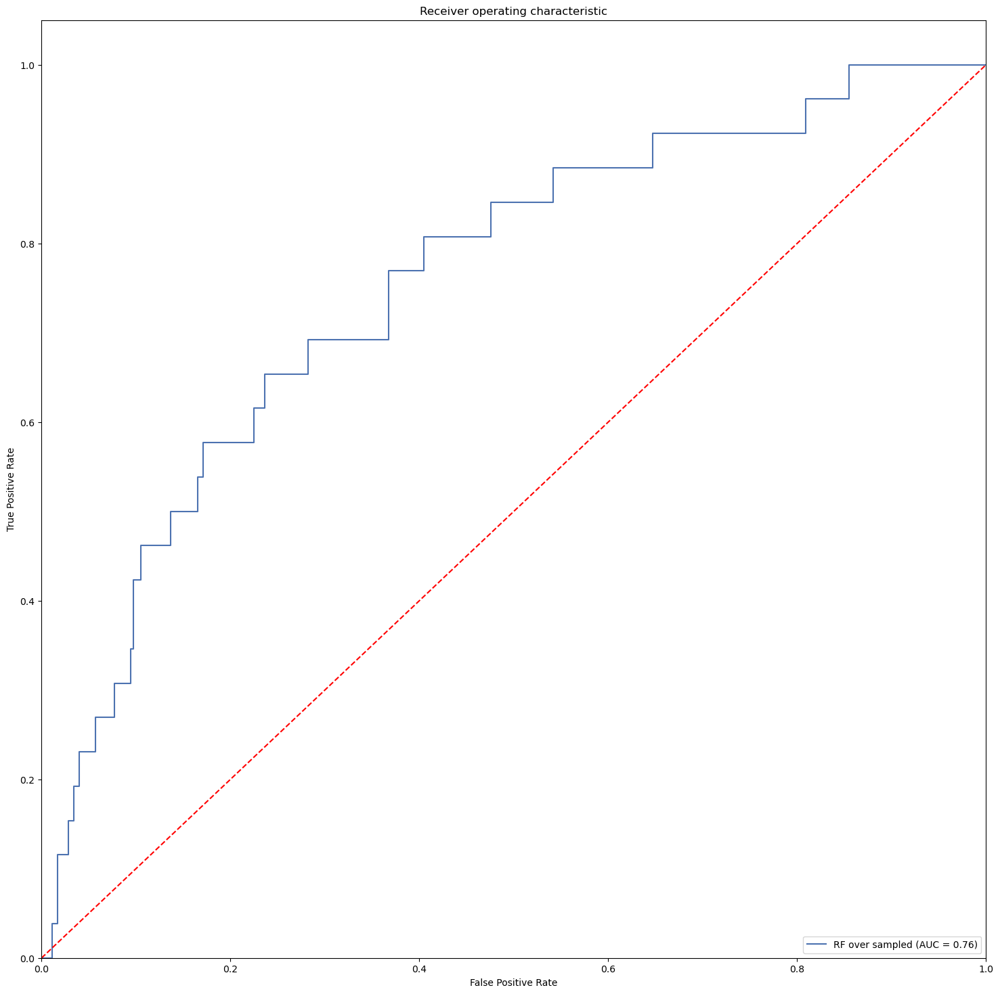

In [159]:
#Plotting ROC and AUC
probs = rf_grid1.predict_proba(X_test_z)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc_rfo = metrics.auc(fpr, tpr)
plt.plot(fpr, tpr, label='RF over sampled (AUC = %0.2f)' % roc_auc_rfo)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [160]:
i = np.arange(len(tpr)) # index for df
roc = pd.DataFrame({'fpr' : pd.Series(fpr, index=i),'tpr' : pd.Series(tpr, index = i), '1-fpr' : pd.Series(1-fpr, index = i), 'tf' : pd.Series(tpr - (1-fpr), index = i), 'threshold' : pd.Series(threshold, index = i)})
print(roc.loc[(roc.tf-0).abs().argsort()[:1]])

         fpr       tpr     1-fpr        tf  threshold
33  0.282051  0.692308  0.717949 -0.025641   0.172719


In [172]:
# store the predicted probabilities  for failed class 
y_pred_prob = rf_grid1.predict_proba(X_test_z)[:, 1]
# predict fail if the predicted probability is greater than 0.1727
thresh = 0.1727
y_pred_class = binarize([y_pred_prob], threshold = thresh)[0]

In [173]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, y_pred_class, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.17      0.69      0.27        26
           0       0.97      0.74      0.84       351

    accuracy                           0.74       377
   macro avg       0.57      0.72      0.56       377
weighted avg       0.91      0.74      0.80       377



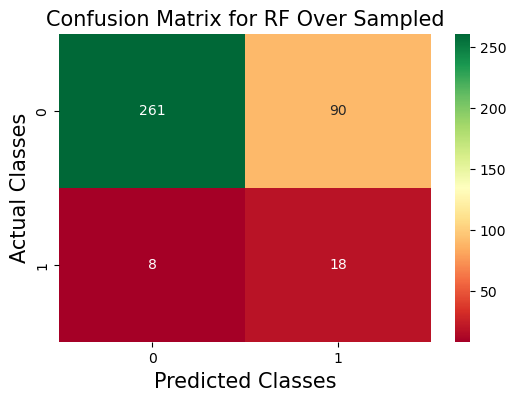

In [174]:
# visualizing confusion matrix
cm= confusion_matrix(y_test, y_pred_class)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for RF Over Sampled', fontsize = 15);

In [175]:
precision_rfo, recall_rfo, f1_score_rfo, support = precision_recall_fscore_support(y_test, y_pred_class, average = 'macro')
print('Precision Score :', '%0.2f' % precision_rfo)
print('Recall Score :', '%0.2f' % recall_rfo)
print('F1-Score:', '%0.2f' % f1_score_rfo)
rfo_acc= accuracy_score(y_test, y_pred_class)
print('Accuracy Score :','%0.2f' % rfo_acc)
print('AUC :','%0.2f' % roc_auc_rfo)
print('Thresholdrf :','%0.4f' % thresh)
Thresholdrf = thresh

Precision Score : 0.57
Recall Score : 0.72
F1-Score: 0.56
Accuracy Score : 0.74
AUC : 0.76
Thresholdrf : 0.1727


In [176]:
modellists = []
modellists.append(['Gaussian NB Normal Data', nb_acc * 100, recall_nb * 100, precision_nb * 100,roc_auc_nb*100,f1_score_nb*100,Thresholdnb])
modellists.append(['Gausian NB under samples data', nbu_acc* 100, recall_nbu * 100, precision_nbu* 100,roc_auc_nbu*100,f1_score_nbu*100,Thresholdnbu])
modellists.append(['Random Forest Over sampled Data', rfo_acc * 100, recall_rfo * 100, precision_rfo * 100,roc_auc_rfo*100,f1_score_rfo*100,Thresholdrf])
model_df = pd.DataFrame(modellists, columns = ['Model', 'Accuracy Scores on Test', 'Recall Score', 'Precision Score','AUC','F1 Score','Threshold'])
model_df

,Model,Accuracy Scores on Test,Recall Score,Precision Score,AUC,F1 Score,Threshold
0,Gaussian NB Normal Data,80.636605,64.743590,54.020979,69.099277,48.520710,0.0114
1,Gausian NB under samples data,66.578249,68.376068,55.185529,70.162174,51.157506,0.6033
2,Random Forest Over sampled Data,74.005305,71.794872,56.846344,75.542406,55.529610,0.1727


### Fitting the resuts on the validation/future dataset

In [184]:
#### making copies of validation dataset
val1=val.copy()
val1=val1.reset_index(drop=True)
val1=pd.DataFrame(val1)
val2=val.copy()
val2=val2.reset_index(drop=True)
val2=pd.DataFrame(val2)
val3=val.copy()
val3=val3.reset_index(drop=True)
val3=pd.DataFrame(val3)
val4=val.copy()
val4=val4.reset_index(drop=True)
val4=pd.DataFrame(val4)


In [185]:
#Fitting Random forest
rf_grid1.fit(X_over, y_over)
pred=rf_grid1.predict(val1)
val1['Pass/Fail'] = pred
val1 = val1[(val1['Pass/Fail'] == 1)]
val1.head(5)

,0,1,2,3,4,6,7,8,9,10,...,565,570,571,572,582,583,586,587,589,Pass/Fail


In [186]:
#fitting Random Forest with threshold
# store the predicted probabilities  for failed class 
y_pred_prob = rf_grid1.predict_proba(val2)[:, 1]
thresh = 0.1727
#predict fail if the predicted probability is greater than 0.1727
pred = binarize([y_pred_prob],  threshold = thresh)[0]
val2['Pass/Fail'] = pred
val2 = val2[(val2['Pass/Fail'] == 1)]
val2.head(5)

,0,1,2,3,4,6,7,8,9,10,...,565,570,571,572,582,583,586,587,589,Pass/Fail
0,2988.41,2598.77,2173.2778,1116.2950,0.8525,103.8200,0.1237,1.3858,-0.0053,0.0054,...,0.2019,529.5182,2.1130,10.65,0.4988,0.0102,0.0243,0.0100,41.0782,1.0
1,2970.86,2510.19,2236.1111,1546.5931,2.0300,90.4233,0.1224,1.3582,-0.0364,0.0032,...,0.1428,532.0973,2.0850,7.74,0.5001,0.0117,0.0243,0.0100,41.0782,1.0
2,2914.04,2487.10,2238.1444,1580.6951,1.0062,91.0489,0.1230,1.4778,0.0095,0.0016,...,0.0877,527.2555,2.1186,7.49,0.4928,0.0141,0.0223,0.0152,68.2176,1.0
3,2889.78,2434.42,2211.4000,1511.7842,1.3004,97.4700,0.1237,1.4596,-0.0016,0.0004,...,0.2387,532.0945,2.0071,5.86,0.5038,0.0145,0.0223,0.0152,68.2176,1.0
4,3133.75,2498.91,2173.2778,1116.2950,0.8525,103.8200,0.1237,1.3956,-0.0075,0.0079,...,0.0534,532.0973,2.0850,7.74,0.4991,0.0104,0.0223,0.0152,68.2176,1.0


In [187]:
#fiiting naive bayes on validation dataset
nb = GaussianNB()
nb.fit(X_train_z, y_train)
pred=nb.predict(val3)
val3['Pass/Fail'] = pred
val3 = val3[(val3['Pass/Fail'] == 1)]
val3.head(313)

,0,1,2,3,4,6,7,8,9,10,...,565,570,571,572,582,583,586,587,589,Pass/Fail


In [188]:
#fitting naive bayes with threshold
# store the predicted probabilities  for failed class 
y_pred_prob = nb.predict_proba(val4)[:, 1]
# predict fail if the predicted probability is greater than Thresholdnb
pred = binarize([y_pred_prob], threshold = Thresholdnb)[0]
val4['Pass/Fail'] = pred
val4 = val4[(val4['Pass/Fail'] == 1)]
val4.head(313)

,0,1,2,3,4,6,7,8,9,10,...,565,570,571,572,582,583,586,587,589,Pass/Fail


#### Observations/Inferences:
- Gaussian Naive bayes without sampling gives a sensitivity/Recall of 35% with a type 2 error rate of 65%, while predicting 0 observation to have failed, adding   a threshold of 0.014 gives a sensitivity of 65% and reduced type 2 error rate by 30% with while predicting few observations to have failed.
- Random Forest with Randomly over sampled data gives 100% type 2 error while predicting 0 observations to have failed, adding a threshold of 0.1727 gives a sensitivity of 71% and type 2 error rate reduces by 71% with while predicting 5 observations as failed.
- Further we can check performance with PCA. 

#### Q5D: Use any other technique/method which can enhance the model performance.
#### Use PCA to check if the dimensions can be reduced futhur more and rebuild all the models tried earlier, check and compare the performance:

In [189]:
#Load the data and pre-processing for pca
pca_df=pd.read_csv('signal-data.csv')
pca_df=pca_df.drop(['Time'],axis=1)
#dropping the columns the have constant signal
cols = pca_df.select_dtypes([np.number]).columns
std = pca_df[cols].std()
cols_to_drop = std[std==0].index
pca_df.drop(cols_to_drop, axis=1,inplace=True)
#label encoding the target class
pca_df['Pass/Fail']=pca_df['Pass/Fail'].replace([-1,1],[0,1])
#replacing the NaN/NA with zero and considering it as no signal
pca_df.fillna(0,inplace=True)
row,column=pca_df.shape
print('The dataset contains', row, 'rows and', column, 'columns')

The dataset contains 1567 rows and 475 columns


In [190]:
sg=pca_df.iloc[0:1549,:]
y=sg['Pass/Fail']
sg=sg.drop(['Pass/Fail'],axis=1)
row,column=sg.shape
print('The past dataset contains', row, 'rows and', column, 'columns')

The past dataset contains 1549 rows and 474 columns


In [191]:
val=pca_df.iloc[1549:1567,:]
val=val.drop(['Pass/Fail'],axis=1)
row,column=val.shape
print('The validation dataset contains', row, 'rows and', column, 'columns')

The validation dataset contains 18 rows and 474 columns


In [192]:
#scaling with z-score
pca_scaled= pca_df.apply(zscore)  
#dropping NaN
pca_scaled.dropna(axis=1,inplace=True)
pca_scaled=pca_scaled.drop(['Pass/Fail'],axis=1)

In [193]:
#splitting the dataset into train and validation set
X=pca_scaled.iloc[0:1549,:]
val=pca_scaled.iloc[1549:,:]
X.shape,val.shape

((1549, 474), (18, 474))

In [194]:
from sklearn.decomposition import PCA
#extracting componenets that explains 95% of the variation
pca = PCA(.95)
pca_ = pca.fit_transform(X)
pca

PCA(n_components=0.95)

In [195]:
X_pca = pca.transform(X)  # PCs for the train data
val_pca = pca.transform(val)    # PCs for the test data

X_pca.shape, val_pca.shape

((1549, 157), (18, 157))

In [196]:
pca.explained_variance_

array([26.22080409, 18.60609873, 14.2876705 , 12.31797431,  9.98762769,
        9.41983101,  8.66949218,  8.271031  ,  8.15437283,  7.31713425,
        6.97399246,  6.77031101,  6.57013811,  6.42121564,  6.22310249,
        6.04463949,  5.82324474,  5.63435019,  5.46068046,  5.32146282,
        5.18383742,  5.10274488,  4.9313613 ,  4.83949245,  4.77128355,
        4.56937419,  4.5235053 ,  4.51616742,  4.36273437,  4.2788662 ,
        4.24664469,  4.13704219,  3.87788074,  3.78651717,  3.73531715,
        3.65234325,  3.53849642,  3.46668818,  3.42465092,  3.35984719,
        3.34096599,  3.30222352,  3.20532974,  3.16100426,  3.09607328,
        3.07193847,  3.03093751,  2.98776536,  2.95901195,  2.91195532,
        2.8211289 ,  2.75560682,  2.7384372 ,  2.69682965,  2.66440901,
        2.65009126,  2.57090894,  2.5393504 ,  2.49148556,  2.43563833,
        2.40703262,  2.39414843,  2.31578548,  2.26480459,  2.23627456,
        2.2228354 ,  2.16147078,  2.13190542,  2.11447667,  2.09

In [197]:
#creating a dataframe of the componenets and attaching it to the target class
pca_z_df = pd.DataFrame(data = X_pca)
pca_final=pd.concat([pca_z_df,y],axis=1)
pca_final.head()

,0,1,2,3,4,5,6,7,8,9,...,148,149,150,151,152,153,154,155,156,Pass/Fail
0,-1.387437,4.585458,4.148942,-0.126890,-1.690074,0.547942,1.072153,2.173500,-0.168146,0.310055,...,0.259623,-0.231536,1.000588,-1.092437,-1.289840,-0.942097,-0.446933,0.060180,-0.829043,0
1,-1.951505,2.716574,3.531193,-0.283655,-2.575505,-0.487276,-0.157016,3.577121,-1.596826,0.528391,...,0.736511,-1.380204,-0.331051,-0.971064,-0.140478,0.289223,-0.246906,-0.986097,0.514680,0
2,0.284405,1.823829,0.231868,-0.233758,-0.003768,-1.036252,-1.818895,2.987563,-0.545366,1.683862,...,-0.626108,-0.645314,0.583232,-1.747104,-0.026172,-1.037125,-0.479576,0.946254,0.828245,1
3,0.450480,2.094986,-2.766983,3.376636,-1.030958,-11.421412,-5.492321,23.790808,19.847518,-0.724578,...,0.351976,-0.786283,-0.176180,-0.177272,-0.062609,-0.567976,0.420287,-0.431949,-0.248790,0
4,0.374518,4.130967,2.464071,0.890253,0.215590,-0.088462,-0.720488,1.502801,5.909626,-0.537582,...,-1.345290,-0.983060,-0.633368,-0.293483,-0.903936,-0.097883,-0.417696,0.534601,1.024531,0


In [198]:
#seperating the DV and IDV
X=pca_final.drop(['Pass/Fail'],axis=1)
y=pca_final['Pass/Fail']

#### Trying various algorithms along with different sampling techniques

#### Splitting the Past data into train and test 70:30 ratio

In [199]:
# splitting data into training and test set for independent attributes
X_train, X_test, y_train, y_test =train_test_split(X,y, test_size=.30,random_state=105,stratify=y)

In [200]:
print("Training Fail    : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 1]), (len(y_train[y_train[:] == 1])/len(y_train)) * 100))
print("Training Pass  : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 0]), (len(y_train[y_train[:] == 0])/len(y_train)) * 100))
print("")
print("Test Fail        : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 1]), (len(y_test[y_test[:] == 1])/len(y_test)) * 100))
print("Test Pass       : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 0]), (len(y_test[y_test[:] == 0])/len(y_test)) * 100))
print("")

Training Fail    : 73 (6.73%)
Training Pass  : 1011 (93.27%)

Test Fail        : 31 (6.67%)
Test Pass       : 434 (93.33%)



In [201]:
# Initializaing various classification algorithms with normal dataset

models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("SVM", SVC(kernel='linear')))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("AB", AdaBoostClassifier()))
models.append(("GBT", GradientBoostingClassifier()))

#testing models
results = []
names = []

for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=55,shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='f1')
    results.append(cv_results)
    names.append(name)
    msg = 'W/ PCA on normal dataset %s: Mean Accuracy %f%% (SD: %f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    display.append(msg)
    print(msg)

W/ PCA on normal dataset LR: Mean Accuracy 19.741686% (SD: 13.066006%)
W/ PCA on normal dataset KNN: Mean Accuracy 0.000000% (SD: 0.000000%)
W/ PCA on normal dataset GNB: Mean Accuracy 17.118240% (SD: 13.014738%)
W/ PCA on normal dataset SVM: Mean Accuracy 17.509053% (SD: 11.455881%)
W/ PCA on normal dataset DT: Mean Accuracy 10.142358% (SD: 7.950292%)
W/ PCA on normal dataset RF: Mean Accuracy 0.000000% (SD: 0.000000%)
W/ PCA on normal dataset AB: Mean Accuracy 4.666667% (SD: 9.451631%)
W/ PCA on normal dataset GBT: Mean Accuracy 6.722222% (SD: 10.329300%)


#### Random undersampling

In [202]:
# Implementing random under sampling
under= RandomUnderSampler(sampling_strategy=0.5)
X_under, y_under= under.fit_resample(X_train, y_train)

In [203]:
print("Under Training Fail    : {0} ({1:0.2f}%)".format(len(y_under[y_under[:] == 1]), (len(y_under[y_under[:] == 1])/len(y_under)) * 100))
print("under Training Pass  : {0} ({1:0.2f}%)".format(len(y_under[y_under[:] == 0]), (len(y_under[y_under[:] == 0])/len(y_under)) * 100))


Under Training Fail    : 73 (33.33%)
under Training Pass  : 146 (66.67%)


In [204]:
# Initializaing various classification algorithms with under sampled dataset

models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("SVM", SVC(kernel='linear')))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("AB", AdaBoostClassifier()))
models.append(("GBT", GradientBoostingClassifier()))

#testing models
results = []
names = []

for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=77,shuffle=True)
    cv_results = cross_val_score(model, X_under, y_under, cv=kfold, scoring='f1')
    results.append(cv_results)
    names.append(name)
    msg = 'W/ PCA Random Undersamping, %s: Mean Accuracy %f%% (SD: %f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    display.append(msg)
    print(msg)

W/ PCA Random Undersamping, LR: Mean Accuracy 45.715790% (SD: 16.201717%)
W/ PCA Random Undersamping, KNN: Mean Accuracy 37.636364% (SD: 15.687763%)
W/ PCA Random Undersamping, GNB: Mean Accuracy 39.890548% (SD: 12.379326%)
W/ PCA Random Undersamping, SVM: Mean Accuracy 46.628094% (SD: 16.757988%)
W/ PCA Random Undersamping, DT: Mean Accuracy 29.854489% (SD: 9.695498%)
W/ PCA Random Undersamping, RF: Mean Accuracy 8.500000% (SD: 18.714967%)
W/ PCA Random Undersamping, AB: Mean Accuracy 29.728938% (SD: 18.528508%)
W/ PCA Random Undersamping, GBT: Mean Accuracy 25.465812% (SD: 20.370647%)


#### SMOTE

In [205]:
# Implementing SMOTE
smt = SMOTE(sampling_strategy=0.5)
X_SMOTE, y_SMOTE = smt.fit_resample(X_train, y_train)

In [206]:
print("SMOTE Training Fail    : {0} ({1:0.2f}%)".format(len(y_SMOTE[y_SMOTE[:] == 1]), (len(y_SMOTE[y_SMOTE[:] == 1])/len(y_SMOTE)) * 100))
print("SMOTE Training Pass  : {0} ({1:0.2f}%)".format(len(y_SMOTE[y_SMOTE[:] == 0]), (len(y_SMOTE[y_SMOTE[:] == 0])/len(y_SMOTE)) * 100))


SMOTE Training Fail    : 505 (33.31%)
SMOTE Training Pass  : 1011 (66.69%)


In [207]:
# Initializaing various classification algorithms with smote sampled dataset

models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("SVM", SVC(kernel='linear')))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("AB", AdaBoostClassifier()))
models.append(("GBT", GradientBoostingClassifier()))

#testing models
results = []
names = []


for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=87,shuffle=True)
    cv_results = cross_val_score(model, X_SMOTE, y_SMOTE, cv=kfold, scoring='f1')
    results.append(cv_results)
    names.append(name)
    msg = 'w/ PCA SMOTE, %s: Mean Accuracy %f%% (SD: %f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    display.append(msg)
    print(msg)

w/ PCA SMOTE, LR: Mean Accuracy 82.242531% (SD: 4.135808%)
w/ PCA SMOTE, KNN: Mean Accuracy 60.892611% (SD: 1.566445%)
w/ PCA SMOTE, GNB: Mean Accuracy 61.884431% (SD: 1.909068%)
w/ PCA SMOTE, SVM: Mean Accuracy 83.937419% (SD: 2.572725%)
w/ PCA SMOTE, DT: Mean Accuracy 77.248912% (SD: 4.296103%)
w/ PCA SMOTE, RF: Mean Accuracy 94.932848% (SD: 3.037064%)
w/ PCA SMOTE, AB: Mean Accuracy 80.590895% (SD: 3.816923%)
w/ PCA SMOTE, GBT: Mean Accuracy 95.211424% (SD: 1.667978%)


#### Random Oversampling

In [208]:
# Implementing random over sampling
over= RandomOverSampler(sampling_strategy=0.5)
X_over, y_over= over.fit_resample(X_train, y_train)

In [209]:
print("over Training Fail    : {0} ({1:0.2f}%)".format(len(y_over[y_over[:] == 1]), (len(y_over[y_over[:] == 1])/len(y_over)) * 100))
print("over Training Pass  : {0} ({1:0.2f}%)".format(len(y_over[y_over[:] == 0]), (len(y_over[y_over[:] == 0])/len(y_over)) * 100))

over Training Fail    : 505 (33.31%)
over Training Pass  : 1011 (66.69%)


In [210]:
# Initializaing various classification algorithms with over sampled dataset

models = []
models.append(("LR", LogisticRegression()))
models.append(("KNN", KNeighborsClassifier()))
models.append(("GNB", GaussianNB()))
models.append(("SVM", SVC(kernel='linear')))
models.append(("DT", DecisionTreeClassifier()))
models.append(("RF", RandomForestClassifier()))
models.append(("AB", AdaBoostClassifier()))
models.append(("GBT", GradientBoostingClassifier()))

#testing models
results = []
names = []


for name, model in models:
    kfold = StratifiedKFold(n_splits=10, random_state=9,shuffle=True)
    cv_results = cross_val_score(model, X_over, y_over, cv=kfold, scoring='f1')
    results.append(cv_results)
    names.append(name)
    msg = 'W/ PCA Random Oversampling, %s: Mean Accuracy %f%% (SD: %f%%)' % (name, cv_results.mean()*100, cv_results.std()*100)
    display.append(msg)
    print(msg)

W/ PCA Random Oversampling, LR: Mean Accuracy 81.885667% (SD: 2.789028%)
W/ PCA Random Oversampling, KNN: Mean Accuracy 84.008439% (SD: 2.786791%)
W/ PCA Random Oversampling, GNB: Mean Accuracy 62.536830% (SD: 5.669125%)
W/ PCA Random Oversampling, SVM: Mean Accuracy 85.315022% (SD: 2.223404%)
W/ PCA Random Oversampling, DT: Mean Accuracy 92.718122% (SD: 2.446987%)
W/ PCA Random Oversampling, RF: Mean Accuracy 99.898990% (SD: 0.303030%)
W/ PCA Random Oversampling, AB: Mean Accuracy 89.814582% (SD: 1.787801%)
W/ PCA Random Oversampling, GBT: Mean Accuracy 99.312585% (SD: 0.766552%)


In [211]:
#Print the Results:
for results in display:
    print(results)

On Normal Dataset LR: MeanAccuracy 13.563564% (SD: 11.989809%)
On Normal Dataset KNN: MeanAccuracy 7.857143% (SD: 12.037357%)
On Normal Dataset GNB: MeanAccuracy 17.922900% (SD: 10.484676%)
On Normal Dataset SVM: MeanAccuracy 15.256093% (SD: 9.623869%)
On Normal Dataset DT: MeanAccuracy 13.930744% (SD: 8.577098%)
On Normal Dataset RF: MeanAccuracy 0.000000% (SD: 0.000000%)
On Normal Dataset AB: MeanAccuracy 6.222222% (SD: 13.063945%)
On Normal Dataset GBT: MeanAccuracy 6.111111% (SD: 9.444444%)
With SMOTE Technique LR: Mean Accuracy 84.855052% (SD: 3.136641%)
With SMOTE Technique KNN: Mean Accuracy 52.738358% (SD: 1.283949%)
With SMOTE Technique GNB: Mean Accuracy 82.589230% (SD: 5.189208%)
With SMOTE Technique SVM: Mean Accuracy 86.071061% (SD: 2.030649%)
With SMOTE Technique DT: Mean Accuracy 78.027069% (SD: 4.586727%)
With SMOTE Technique RF: Mean Accuracy 95.899510% (SD: 1.824272%)
With SMOTE Technique AB: Mean Accuracy 89.353498% (SD: 3.452413%)
With SMOTE Technique GBT: Mean Accu

#### Logistic Regression with Normal dataset

In [212]:
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV
param_grid = [    
    {'penalty' : ['l1', 'l2', 'elasticnet', 'none'],
    'C' : [1,2,4],
    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter' : [100, 1000,2500, 5000]
    }
]

lg=LogisticRegression()

log = GridSearchCV(lg, param_grid = param_grid, cv = 5, verbose=2, n_jobs=-1)
log.fit(X_train,y_train)
log.best_estimator_

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


LogisticRegression(C=1, penalty='l1', solver='saga')

In [213]:
lg=LogisticRegression(C=1, max_iter=1000, penalty='l1', solver='saga')
lg.fit(X_train,y_train)

LogisticRegression(C=1, max_iter=1000, penalty='l1', solver='saga')

In [214]:
modellg= lg.score(X_train, y_train)
print('Accuracy Score of Training Data: ', modellg)

Accuracy Score of Training Data:  0.9501845018450185


In [215]:
y_predictlg= lg.predict(X_test)
modellg = accuracy_score(y_test, y_predictlg)
print('Accuracy Score of Test Data:', modellg)

Accuracy Score of Test Data: 0.9075268817204301


In [216]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, y_predictlg, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.17      0.10      0.12        31
           0       0.94      0.97      0.95       434

    accuracy                           0.91       465
   macro avg       0.55      0.53      0.54       465
weighted avg       0.89      0.91      0.90       465



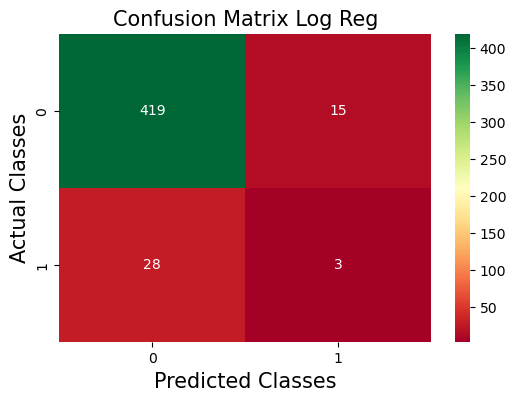

In [217]:
# visualizing confusion matrix
cm= confusion_matrix(y_test, y_predictlg)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix Log Reg', fontsize = 15);

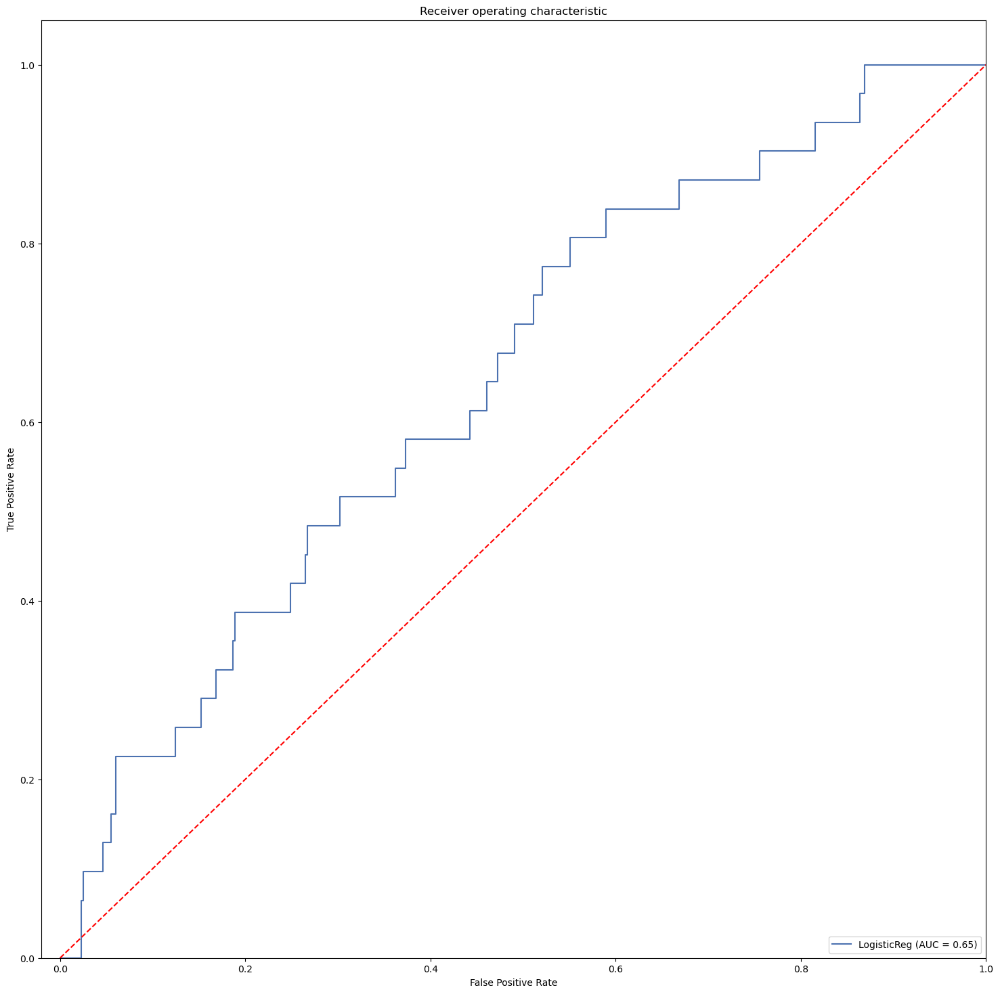

In [218]:
#Plotting ROC and AUC
probs = lg.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc_lg = metrics.auc(fpr, tpr)
plt.plot(fpr, tpr, label='LogisticReg (AUC = %0.2f)' % roc_auc_lg)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [219]:
i = np.arange(len(tpr)) # index for df
roc = pd.DataFrame({'fpr' : pd.Series(fpr, index=i),'tpr' : pd.Series(tpr, index = i), '1-fpr' : pd.Series(1-fpr, index = i), 'tf' : pd.Series(tpr - (1-fpr), index = i), 'threshold' : pd.Series(threshold, index = i)})
print(roc.loc[(roc.tf-0).abs().argsort()[:1]])

         fpr       tpr     1-fpr        tf  threshold
34  0.442396  0.580645  0.557604  0.023041   0.032491


In [220]:
# store the predicted probabilities for failed class 
y_pred_prob = lg.predict_proba(X_test)[:, 1]
# predict failed if the predicted probability is greater than 0.0324
thresh = 0.0324
from sklearn.preprocessing import binarize
y_pred_class = binarize([y_pred_prob], threshold = thresh)[0]

In [221]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, y_pred_class, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.09      0.58      0.15        31
           0       0.95      0.56      0.70       434

    accuracy                           0.56       465
   macro avg       0.52      0.57      0.43       465
weighted avg       0.89      0.56      0.67       465



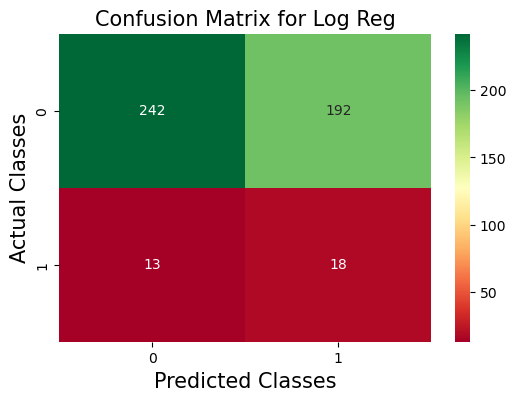

In [222]:
# visualizing confusion matrix
cm= confusion_matrix(y_test, y_pred_class)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for Log Reg', fontsize = 15);

In [223]:
precision_lg, recall_lg, f1_score_lg, support = precision_recall_fscore_support(y_test, y_pred_class, average = 'macro')
print('Precision Score :', '%0.2f' % precision_lg)
print('Recall Score :', '%0.2f' % recall_lg)
print('F1-Score:', '%0.2f' % f1_score_lg)
lg_acc= accuracy_score(y_test, y_pred_class)
print('Accuracy Score :','%0.2f' % lg_acc)
print('AUC :','%0.2f' % roc_auc_lg)
print('Threshold :','%0.4f' % 0.0324)
Thresholdlo=0.0324

Precision Score : 0.52
Recall Score : 0.57
F1-Score: 0.43
Accuracy Score : 0.56
AUC : 0.65
Threshold : 0.0324


#### SVM with undersampled data

In [224]:
# Implementing random under sampling
under= RandomUnderSampler(sampling_strategy=0.5)
X_under, y_under= under.fit_resample(X_train, y_train)

In [225]:
param_grid = {'C': [0.1,1, 10, 100], 'gamma': [1,0.1,0.01,0.001],'kernel': ['rbf', 'poly', 'sigmoid']}
# Make grid search classifier
svm_grid= GridSearchCV(SVC(), param_grid, verbose = 2,cv=5, n_jobs = -1)
 
# Train the classifier
svm_grid.fit(X_under, y_under)
svm_grid.best_params_

Fitting 5 folds for each of 48 candidates, totalling 240 fits


{'C': 10, 'gamma': 0.001, 'kernel': 'sigmoid'}

In [226]:
svc_cv = SVC(kernel = 'sigmoid', gamma = 0.001, C = 1,probability=True)
svc_cv.fit(X_under,y_under)

SVC(C=1, gamma=0.001, kernel='sigmoid', probability=True)

In [227]:
modelsv_score = svc_cv.score(X_under, y_under)
print('Accuracy Score of Training Data: ', modelsv_score)

Accuracy Score of Training Data:  0.7123287671232876


In [228]:
y_predictsv= svc_cv.predict(X_test)
modelsv_score = accuracy_score(y_test, y_predictsv)
print('Accuracy Score of Test Data:', modelsv_score)

Accuracy Score of Test Data: 0.9118279569892473


In [229]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, y_predictsv, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.08      0.03      0.05        31
           0       0.93      0.97      0.95       434

    accuracy                           0.91       465
   macro avg       0.51      0.50      0.50       465
weighted avg       0.88      0.91      0.89       465



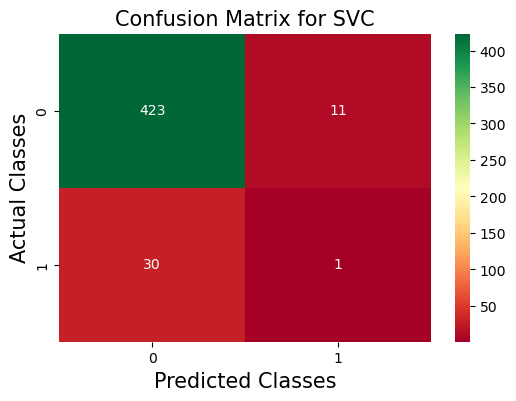

In [230]:
# visualizing confusion matrix
cm= confusion_matrix(y_test, y_predictsv)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for SVC', fontsize = 15);

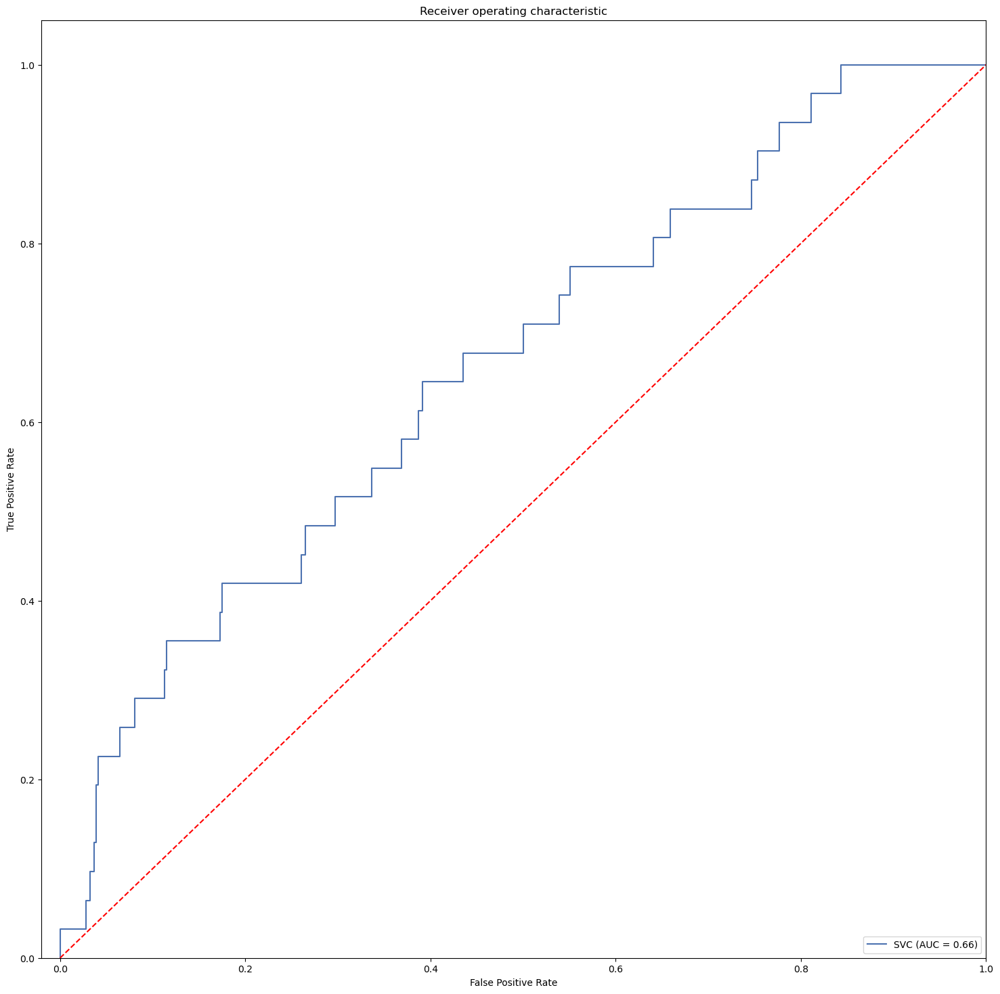

In [231]:
#Plotting ROC and AUC
probs = svc_cv.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc_sv = metrics.auc(fpr, tpr)
plt.plot(fpr, tpr, label='SVC (AUC = %0.2f)' % roc_auc_sv)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [232]:
i = np.arange(len(tpr)) # index for df
roc = pd.DataFrame({'fpr' : pd.Series(fpr, index=i),'tpr' : pd.Series(tpr, index = i), '1-fpr' : pd.Series(1-fpr, index = i), 'tf' : pd.Series(tpr - (1-fpr), index = i), 'threshold' : pd.Series(threshold, index = i)})
print(roc.loc[(roc.tf-0).abs().argsort()[:1]])

         fpr       tpr     1-fpr   tf  threshold
35  0.387097  0.612903  0.612903  0.0   0.309003


In [233]:
thresh = 0.3090
# store the predicted probabilities for failed class 
y_pred_prob = svc_cv.predict_proba(X_test)[:, 1]
# predict failed if the predicted probability is greater than 0.3390
y_pred_class = binarize([y_pred_prob], threshold=thresh)[0]

In [234]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, y_pred_class, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.10      0.61      0.17        31
           0       0.96      0.61      0.75       434

    accuracy                           0.61       465
   macro avg       0.53      0.61      0.46       465
weighted avg       0.90      0.61      0.71       465



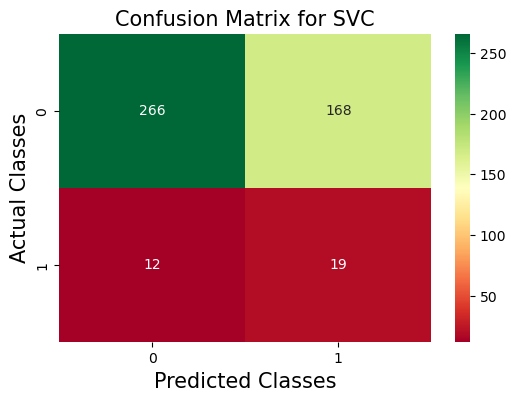

In [235]:
# visualizing confusion matrix
cm= confusion_matrix(y_test, y_pred_class)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for SVC', fontsize = 15);

In [236]:
precision_sv, recall_sv, f1_score_sv, support = precision_recall_fscore_support(y_test, y_pred_class, average = 'macro')
print('Precision Score :', '%0.2f' % precision_sv)
print('Recall Score :', '%0.2f' % recall_sv)
print('F1-Score:', '%0.2f' % f1_score_sv)
sv_acc= accuracy_score(y_test, y_pred_class)
print('Accuracy Score :','%0.2f' % sv_acc)
print('AUC :','%0.2f' % roc_auc_sv)
print('Threshold :','%0.4f' % thresh)
Thresholdsv=0.3304

Precision Score : 0.53
Recall Score : 0.61
F1-Score: 0.46
Accuracy Score : 0.61
AUC : 0.66
Threshold : 0.3090


#### Random Forest with over sampled data

In [237]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 500, num = 50)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = range(2,100,5)
# Minimum number of samples required at each leaf node
min_samples_leaf = range(1,100,10)
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
                'criterion':['gini','entropy']}

In [238]:
rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, cv = 5, verbose=2, random_state=90, n_jobs = -1)
rf_random.fit(X_over, y_over)
rf_random.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits


{'n_estimators': 463,
 'min_samples_split': 82,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 110,
 'criterion': 'gini',
 'bootstrap': False}

In [239]:
rf_grid1 = RandomForestClassifier(n_estimators=463,
 min_samples_split= 82,
 min_samples_leaf=1,
 max_features= 'sqrt',
 max_depth= 110,
 criterion= 'gini',
 bootstrap= False)
rf_grid1.fit(X_over, y_over)

RandomForestClassifier(bootstrap=False, max_depth=110, min_samples_split=82,
                       n_estimators=463)

In [240]:
modelrfg1_score=rf_grid1.score(X_over,y_over)
print('Accuracy Score of Training Data: ', modelrfg1_score)

Accuracy Score of Training Data:  0.9947229551451188


In [241]:
y_predictrfg1= rf_grid1.predict(X_test)
modelrfg1_score = accuracy_score(y_test, y_predictrfg1)
print('Accuracy Score of Test Data:', modelrfg1_score)

Accuracy Score of Test Data: 0.9333333333333333


In [242]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, y_predictrfg1, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        31
           0       0.93      1.00      0.97       434

    accuracy                           0.93       465
   macro avg       0.47      0.50      0.48       465
weighted avg       0.87      0.93      0.90       465



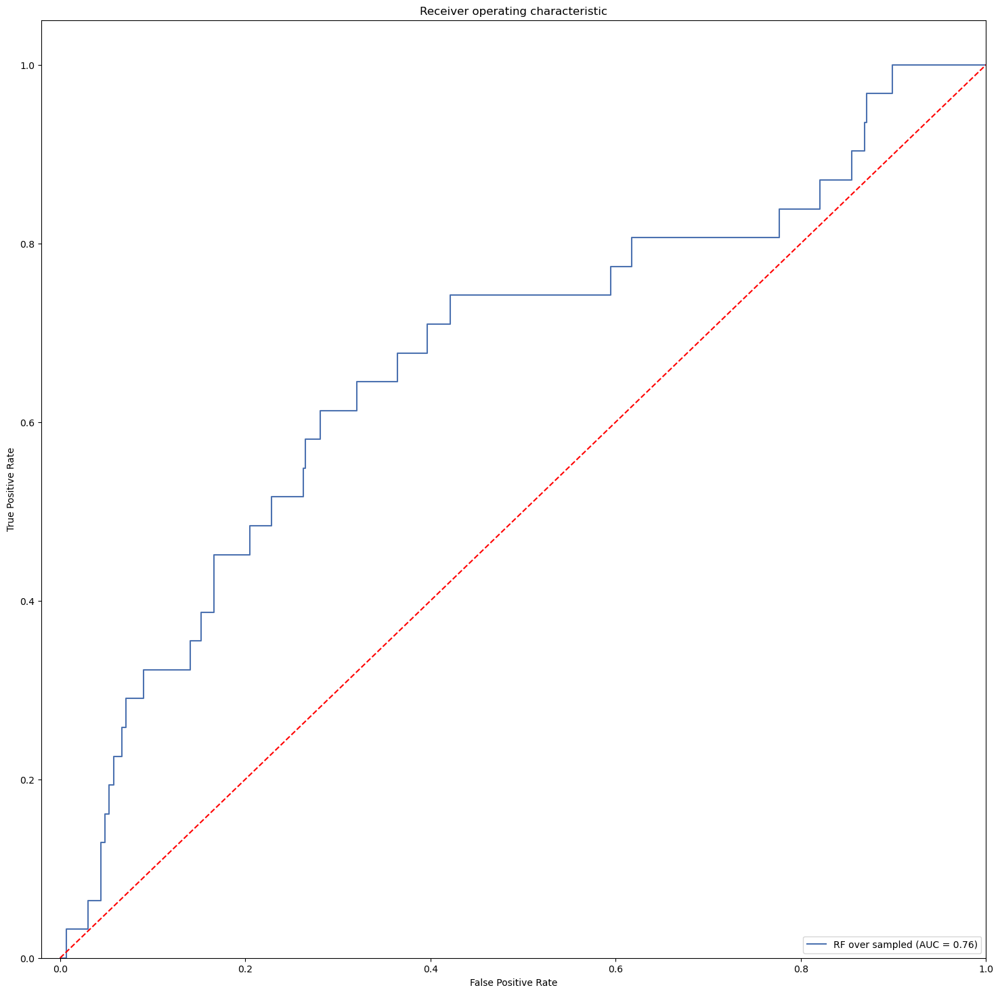

In [243]:
#Plotting ROC and AUC
probs = rf_grid1.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc_rfo_pc = metrics.auc(fpr, tpr)
plt.plot(fpr, tpr, label='RF over sampled (AUC = %0.2f)' % roc_auc_rfo)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [244]:
i = np.arange(len(tpr)) # index for df
roc = pd.DataFrame({'fpr' : pd.Series(fpr, index=i),'tpr' : pd.Series(tpr, index = i), '1-fpr' : pd.Series(1-fpr, index = i), 'tf' : pd.Series(tpr - (1-fpr), index = i), 'threshold' : pd.Series(threshold, index = i)})
print(roc.loc[(roc.tf-0).abs().argsort()[:1]])

         fpr       tpr     1-fpr        tf  threshold
38  0.364055  0.645161  0.635945  0.009217    0.16823


In [245]:
thresh = 0.1682
# store the predicted probabilities  for failed class 
y_pred_prob = rf_grid1.predict_proba(X_test)[:, 1]
# predict fail if the predicted probability is greater than 0.1608
from sklearn.preprocessing import binarize
y_pred_class = binarize([y_pred_prob], threshold = thresh)[0]

In [246]:
#printing classification report
print("Classification Report")
print(metrics.classification_report(y_test, y_pred_class, labels=[1, 0]))

Classification Report
              precision    recall  f1-score   support

           1       0.11      0.65      0.19        31
           0       0.96      0.64      0.77       434

    accuracy                           0.64       465
   macro avg       0.54      0.64      0.48       465
weighted avg       0.91      0.64      0.73       465



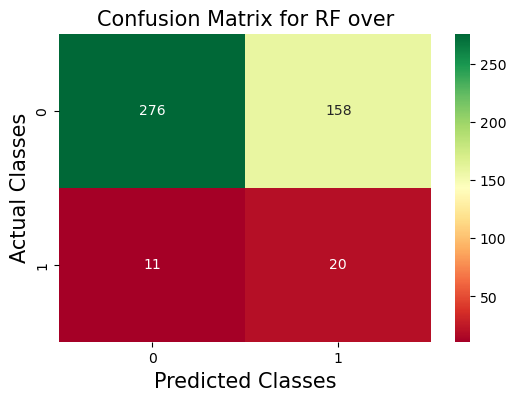

In [247]:
# visualizing confusion matrix
cm= confusion_matrix(y_test, y_pred_class)
plt.figure(figsize = (6, 4))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.ylabel('Actual Classes', fontsize = 15)
plt.xlabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for RF over', fontsize = 15);

In [251]:
precision_rfo_pc, recall_rfo_pc, f1_score_rfo_pc, support = precision_recall_fscore_support(y_test, y_pred_class, average = 'macro')
print('Precision Score :', '%0.2f' % precision_rfo_pc)
print('Recall Score :', '%0.2f' % recall_rfo_pc)
print('F1-Score:', '%0.2f' % f1_score_rfo_pc)
rfo_acc_pc= accuracy_score(y_test, y_pred_class)
print('Accuracy Score :','%0.2f' % rfo_acc_pc)
print('AUC :','%0.2f' % roc_auc_rfo_pc)
print('Threshold :','%0.4f' % thresh)
Thresholdrf_pc=0.1682

Precision Score : 0.54
Recall Score : 0.64
F1-Score: 0.48
Accuracy Score : 0.64
AUC : 0.67
Threshold : 0.1682


In [252]:
modellists_pc = []
modellists_pc.append(['PCA w/ LogigisticRegression on Normal Data', lg_acc * 100, recall_lg * 100, precision_lg * 100,roc_auc_lg*100,f1_score_nb*100,Thresholdlo])
modellists_pc.append(['PCA w/ SVM on Under sampled data', sv_acc * 100, recall_sv * 100, precision_sv* 100,roc_auc_sv*100,f1_score_sv*100,Thresholdsv])
modellists_pc.append(['PCA w/ RF on Over sampled Data', rfo_acc_pc * 100, recall_rfo_pc * 100, precision_rfo_pc * 100,roc_auc_rfo_pc*100,f1_score_rfo_pc*100,Thresholdrf_pc])
model_df_pc = pd.DataFrame(modellists_pc, columns = ['Model', 'Accuracy Scores on Test', 'Recall Score', 'Precision Score','AUC','F1 Score','Threshold'])


In [253]:
concatenated_df = pd.concat([model_df, model_df_pc], ignore_index=True)
concatenated_df

,Model,Accuracy Scores on Test,Recall Score,Precision Score,AUC,F1 Score,Threshold
0,Gaussian NB Normal Data,80.636605,64.743590,54.020979,69.099277,48.520710,0.0114
1,Gausian NB under samples data,66.578249,68.376068,55.185529,70.162174,51.157506,0.6033
2,Random Forest Over sampled Data,74.005305,71.794872,56.846344,75.542406,55.529610,0.1727
3,PCA w/ LogigisticRegression on Normal Data,55.913978,56.912442,51.736695,64.701947,48.520710,0.0324
4,PCA w/ SVM on Under sampled data,61.290323,61.290323,52.921941,66.129032,46.075147,0.3304
5,PCA w/ RF on Over sampled Data,63.655914,64.055300,53.701601,67.154750,47.849544,0.1682


#### Fitting the result in the validation/future dataset

In [254]:
#making copies of validation dataset
val_pca=pd.DataFrame(val_pca)
val1=val_pca.copy()
val1=pd.DataFrame(val1)
val1=val1.reset_index(drop=True)
val2=val_pca.copy()
val2=pd.DataFrame(val2)
val2=val2.reset_index(drop=True)

In [255]:
svc_cv.fit(X_under,y_under)
pred=svc_cv.predict(val1)
val1['Pass/Fail'] = pred
val1 = val1[(val1['Pass/Fail'] == 1)]
val1.head(18)

,0,1,2,3,4,5,6,7,8,9,...,148,149,150,151,152,153,154,155,156,Pass/Fail


In [256]:
#fitting SVM with threshold
# store the predicted probabilities for failed class 
y_pred_prob = svc_cv.predict_proba(val2)[:, 1]
# predict failed if the predicted probability is greater than set 0.339
pred= binarize([y_pred_prob], threshold=Thresholdsv)[0]
val2['Pass/Fail'] = pred
val2 = val2[(val2['Pass/Fail'] == 1)]
val2.head(18)

,0,1,2,3,4,5,6,7,8,9,...,148,149,150,151,152,153,154,155,156,Pass/Fail
6,-0.481096,-5.195907,-3.400193,0.429666,0.306720,-0.167585,-1.710567,1.760385,-0.734014,-5.448427,...,1.206864,-2.198910,-0.755132,0.470613,0.587253,-0.437698,1.252904,0.064008,2.781293,1.0
8,0.692482,-3.480218,-2.926546,0.920080,0.038892,-0.226945,-0.382162,0.005476,0.418494,-2.670390,...,0.374074,0.697389,-1.045934,1.232704,0.130177,0.217272,-0.412865,-0.760997,-0.307582,1.0
9,-0.666211,-1.308526,-0.926267,-0.571549,-1.546686,0.718440,0.074039,1.390570,-0.424159,-0.230167,...,-3.541504,-1.718643,-0.286009,0.683506,-1.008075,-2.312358,-3.621649,-1.990466,0.285139,1.0
14,-0.380919,-0.277378,0.516269,1.365564,-1.002398,0.795968,-0.040909,4.421150,-2.589889,-3.171151,...,0.524017,0.072159,0.048762,-0.466015,-0.253308,-0.061711,-0.461481,0.381082,0.598430,1.0


#### Observations/inference:
- We have performed KFold CV on Logistic Regression, KNN, Ganussian NB, SVM(SVC), DecisionTrees, RandomForest, AdaBoost,    GradientBoosting Technique Classifiers and got their mean Accuracy and Standard deviation of accuracies.
- Since the target data is highly imbalanced, we used Random Under Sample, SMOTE, Random Over Sample Technique to treat imbalance data and improve performance.
- For this particular signal dataset, Recall/Sensitivity is most important and hence we use Type-2 error metric as well.
- We used GridSearchCV and RandomSearchCV along with Hyper parameters to boost performance.
- We used PCA techniqueue to reduce feature dimensions.
- From the above models, we selected Gaussian NB on normal data and under sampled data models, Random Forest with Random Over sampled data model, Logistic Regression on Normal data, SVM with under sampled data models to furthur enhance performance by analysing their confusion matrices, adjusting the ROC curve thresholds and improved the performance.
- We have divided data into Training, Validation and Test and applied the result on unseen data.
- Without PCA, Random Forest with Over sampling method fared well compared to rest other models including the PCA methods.
  It has highest recall score(72%) with better Type-2 error(28%) improved with ROC threshold 0.1745 and has decent accuracy.
 - With PCA, there doesnt seem to have much improvement.

In [258]:
#Strafied cross validation to check how well Random forest with Random over sampling would perform on an unseen data
stratified_kfold = StratifiedKFold(n_splits = 10, random_state = 25,shuffle=True)
results= cross_val_score(rf_grid1, X_over, y_over, cv = stratified_kfold)
print('Accuracy Score')
print('Avearge: ', results.mean())
print('Standard deviation: ', results.std())

Accuracy Score
Avearge:  0.9888027187173231
Standard deviation:  0.009327002087605072


#### Random Forest without PCA using over sampling would perform between 97.8 and 100% on 95% of the times.

In [259]:
#Strafied cross validation to check how well SVM with PCA with Random under sampling techniques would perform on an unseen data
stratified_kfold = StratifiedKFold(n_splits = 10, random_state = 55,shuffle=True)
results = cross_val_score(svc_cv, X_under, y_under, cv = stratified_kfold)
print('Accuracy Score')
print('Avearge: ', results.mean())
print('Standard deviation: ', results.std())

Accuracy Score
Avearge:  0.6893939393939394
Standard deviation:  0.045074166001950064


#### On Unseen data, SVM with PCA and Random under sampling would perform between 56% to 74% for  95% of the times.

#### Q6  Post Training and Conclusion:
#### Q6A: Display and compare all the models designed with their train and test accuracies

In [260]:
#Print the Mean Accuracy and Standard Deviation of all models trained:
display

['On Normal Dataset LR: MeanAccuracy 13.563564% (SD: 11.989809%)',
 'On Normal Dataset KNN: MeanAccuracy 7.857143% (SD: 12.037357%)',
 'On Normal Dataset GNB: MeanAccuracy 17.922900% (SD: 10.484676%)',
 'On Normal Dataset SVM: MeanAccuracy 15.256093% (SD: 9.623869%)',
 'On Normal Dataset DT: MeanAccuracy 13.930744% (SD: 8.577098%)',
 'On Normal Dataset RF: MeanAccuracy 0.000000% (SD: 0.000000%)',
 'On Normal Dataset AB: MeanAccuracy 6.222222% (SD: 13.063945%)',
 'On Normal Dataset GBT: MeanAccuracy 6.111111% (SD: 9.444444%)',
 'With SMOTE Technique LR: Mean Accuracy 84.855052% (SD: 3.136641%)',
 'With SMOTE Technique KNN: Mean Accuracy 52.738358% (SD: 1.283949%)',
 'With SMOTE Technique GNB: Mean Accuracy 82.589230% (SD: 5.189208%)',
 'With SMOTE Technique SVM: Mean Accuracy 86.071061% (SD: 2.030649%)',
 'With SMOTE Technique DT: Mean Accuracy 78.027069% (SD: 4.586727%)',
 'With SMOTE Technique RF: Mean Accuracy 95.899510% (SD: 1.824272%)',
 'With SMOTE Technique AB: Mean Accuracy 89.3

In [261]:
#Print all the models training and  adjusted using ROC threshold
concatenated_df

,Model,Accuracy Scores on Test,Recall Score,Precision Score,AUC,F1 Score,Threshold
0,Gaussian NB Normal Data,80.636605,64.743590,54.020979,69.099277,48.520710,0.0114
1,Gausian NB under samples data,66.578249,68.376068,55.185529,70.162174,51.157506,0.6033
2,Random Forest Over sampled Data,74.005305,71.794872,56.846344,75.542406,55.529610,0.1727
3,PCA w/ LogigisticRegression on Normal Data,55.913978,56.912442,51.736695,64.701947,48.520710,0.0324
4,PCA w/ SVM on Under sampled data,61.290323,61.290323,52.921941,66.129032,46.075147,0.3304
5,PCA w/ RF on Over sampled Data,63.655914,64.055300,53.701601,67.154750,47.849544,0.1682


 #### Q6B: Select the final best trained model along with your detailed comments for selecting this model.

- On unseen data, it seems without PCA and Random Forest with Over sampling method fared well compared to rest other models including the PCA methods. It has highest recall score(72%) with better Type-2 error(28%) improved with ROC threshold 0.1727 and has decent accuracy. With PCA, there doesnt seem to have much improvement.

#### Q6C: Pickle the selected model for future use.
- From the above observations/analysis and inferences, we found Random Forest Classifier with over sampled data as a most apt model(with ROC threshold adjusted to 1727) and we will pickle this model for future use.

In [262]:
import pickle
# Save the model using pickle
with open('rf_grid1.pkl', 'wb') as f:
    pickle.dump(rf_grid1, f)

In [263]:
# Load the model from the saved file
with open('rf_grid1.pkl', 'rb') as f:
    loaded_model = pickle.load(f)

#### Q6E: Write your conclusion on the results.
#### Conclusions:
- Based on the overall analysis and performances of the model we can go ahead and narrow down the observation that are common to the all the validations sets and infer that these are likely to fail. This definetly needs to be checked with a domain specialist to get an acceptable threshold limit of the Type 2 error rate and would be able choose the best performing model based on that, As far as PCA is considered, the models does better without it, Random Forest with Random oversampling gives the best overall results.

### *********** END OF FMT PROJECT ************